In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import pickle

In [2]:
from PIL import Image

In [3]:
from skimage.color import rgb2hsv, rgb2lab, hsv2rgb, lab2rgb
from matplotlib.colors import hsv_to_rgb

In [4]:
from LogGabor import LogGabor

from PYramid2 import cropped_pyramid, local_filter, get_K, log_gabor_transform
from PYramid2 import inverse_pyramid, get_K_inv, inverse_gabor


Default lg shape= 32 32


In [5]:
width = 32
n_levels = 7 #int(np.log(np.max((N_X, N_Y))/width)/np.log(base_levels)) + 1
base_levels = 2
n_color = 3
r_min = width / 4 #width/16 
r_max = width / 2 #7 * width/16
n_sublevel = n_eccentricity = 2
n_azimuth = 16
n_theta = 8
n_phase = 2

In [6]:
pyramid_n_params = width*width*n_color*n_levels
print('pyramids #params :', pyramid_n_params)
logpolar_n_params = n_levels * n_color * n_eccentricity * n_azimuth * n_theta * n_phase
print('logpolar #params :', logpolar_n_params)

pyramids #params : 21504
logpolar #params : 10752


In [7]:
out_chan=30
gauss = False
do_mask = False
color = True
color_mode= 'lab' # 'hsv' #True
print ('encoder #params :', out_chan*n_color*n_levels)

encoder #params : 630


In [8]:
if gauss:
    script_name = '2021-02-11-log-polar-convolutional-autoenc-gauss-'+color_mode
else:
    script_name = '2021-02-11-log-polar-convolutional-autoenc-laplace-'+color_mode

### Image utilities

In [9]:
def tensor_pyramid_display(img_pyr_tens, global_bias = 0):
    fig, axs = plt.subplots(1, n_levels, figsize=(20,20))
    img_aff = img_pyr_tens.permute(0,1,3,4,2).detach().numpy()
    for i_level, ax in enumerate(axs):
        if i_level < n_levels-1 and not gauss:
            bias = 128
        else:
            bias = global_bias
        ax.imshow((img_aff[0, i_level, ...]+bias).clip(0,255).astype('uint8'))
        ax.plot([width/2], [width/2], 'r+', ms=32);
    #print('Tensor shape=', img_rec.shape) 
    return axs

In [10]:
def tensor_image_cmp(img_tens_ref, img_tens_rec):
    fig, ax = plt.subplots(1, 2, figsize=(20,10))
    img_aff_ref = img_tens_ref.detach().permute(0,2,3,1).squeeze().detach().numpy().clip(0,255).astype('uint8')
    ax[0].imshow(img_aff_ref)
    N_X, N_Y, _ = img_aff_ref.shape
    ax[0].plot([N_Y//2], [N_X//2], 'r+', ms=16)
    ax[0].set_title('LOG GABOR RECONSTRUCTION')
    img_aff_rec = img_tens_rec.detach().permute(0,2,3,1).squeeze().detach().numpy().clip(0,255).astype('uint8')
    ax[1].imshow(img_aff_rec)
    ax[1].plot([N_Y//2], [N_X//2], 'r+', ms=16)
    ax[1].set_title('AUTO-ENCODER RECONSTRUCTION')
    return ax

### Log Gabor filters

In [11]:
pe = {'N_X': width, 'N_Y': width, 'do_mask': do_mask, 'base_levels':
          base_levels, 'n_theta': 24, 'B_sf': 0.6, 'B_theta': np.pi/12 ,
      'use_cache': True, 'figpath': 'results', 'edgefigpath':
          'results/edges', 'matpath': 'cache_dir', 'edgematpath':
          'cache_dir/edges', 'datapath': 'database/', 'ext': '.pdf', 'figsize':
          14.0, 'formats': ['pdf', 'png', 'jpg'], 'dpi': 450, 'verbose': 0}   

lg = LogGabor(pe)

print('lg shape=', lg.pe.N_X, lg.pe.N_Y)


lg shape= 32 32


In [12]:
K = get_K(width=width,
          n_sublevel = n_sublevel, 
          n_azimuth = n_azimuth, 
          n_theta = n_theta,
          n_phase = n_phase, 
          r_min = r_min, 
          r_max = r_max, 
          log_density_ratio = 2, 
          verbose=True,
          lg=lg)

i_sublevel, sf_0, radius 0 0.36067376022224085 8.0
i_sublevel, sf_0, radius 1 0.25503486164919736 11.31370849898476
K shape= torch.Size([32, 32, 2, 16, 8, 2])
K min max= tensor(-1.) tensor(1.)


### Gabor filters pseudo-inverse

Filter tensor shape= torch.Size([32, 32, 2, 16, 8, 2])
Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([512, 1024])


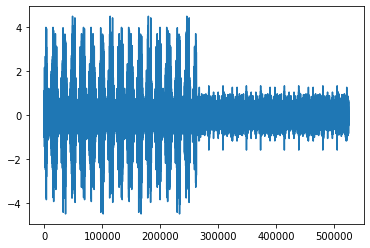

In [13]:
K_inv = get_K_inv(K, width=width, n_sublevel = n_sublevel, n_azimuth = n_azimuth, n_theta = n_theta, n_phase = n_phase)
plt.plot(K_inv.flatten())

Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


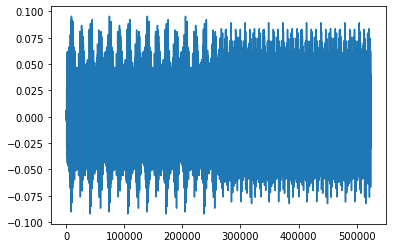

In [14]:
### regularized inverse gabor
K_ = K.reshape((width**2, n_sublevel*n_azimuth*n_theta*n_phase))
print('Reshaped filter tensor=', K_.shape)
K_inv_rcond = torch.pinverse(K_, rcond=0.3) 
print('Tensor shape=', K_inv.shape)
K_inv_rcond =K_inv_rcond.reshape(n_sublevel, n_azimuth, n_theta, n_phase, width, width)

plt.figure()
plt.plot(K_inv_rcond.flatten())

### Honeycomb space coverage tests

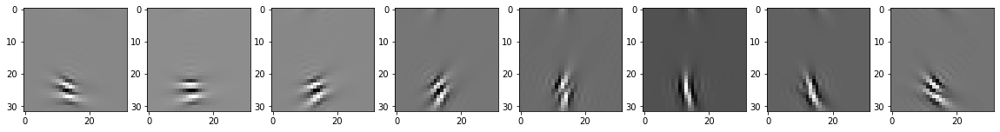

In [15]:
plt.figure(figsize=(20,3))
for i_theta in range(n_theta):
    coefs = torch.zeros((n_sublevel, n_azimuth, n_theta, n_phase))
    coefs[:, n_azimuth-1, i_theta, 0] = 1
    img_dis = torch.tensordot(K, coefs, dims=4)
    plt.subplot(1,n_theta,i_theta+1)
    plt.imshow(img_dis.numpy()[:, :, ...], cmap='gray')

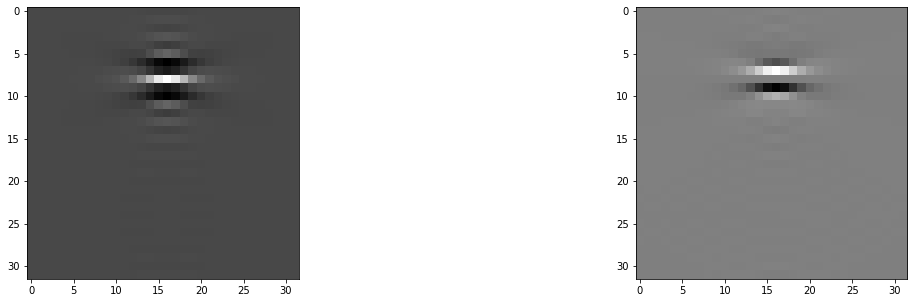

In [102]:
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
coefs = torch.zeros((n_sublevel, n_azimuth, n_theta, n_phase))
coefs[0, 8, 0, 0] = 1
img_dis = torch.tensordot(K, coefs, dims=4)
plt.imshow(img_dis.numpy()[:, :, ...], cmap='gray')
plt.subplot(1,2,2)
coefs = torch.zeros((n_sublevel, n_azimuth, n_theta, n_phase))
coefs[0, 8, 0, 1] = 1
img_dis = torch.tensordot(K, coefs, dims=4)
plt.imshow(img_dis.numpy()[:, :, ...], cmap='gray')

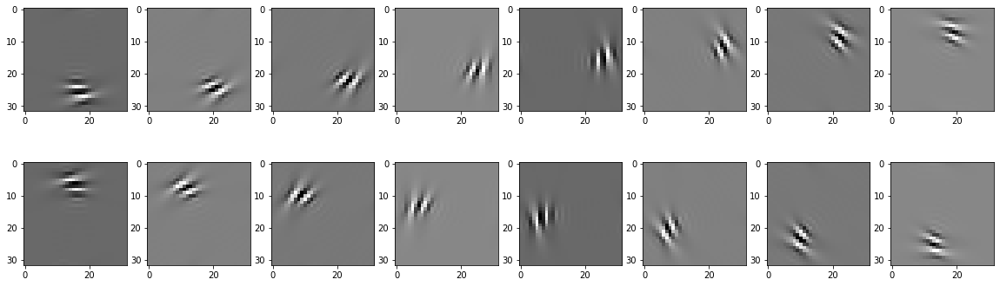

In [16]:
plt.figure(figsize=(20,6))
for i_az in range(n_azimuth):
    coefs = torch.zeros((n_sublevel, n_azimuth, n_theta, n_phase))
    coefs[:, i_az, 0, 0] = 1
    img_dis = torch.tensordot(K, coefs, dims=4)
    plt.subplot(2,n_azimuth//2,i_az+1)
    plt.imshow(img_dis.numpy()[:, :, ...], cmap='gray')

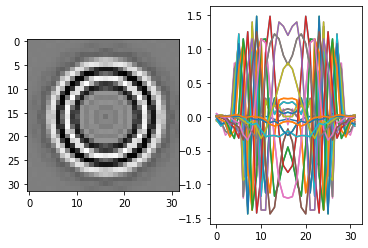

In [17]:
coefs = torch.zeros((n_sublevel, n_azimuth, n_theta, n_phase))
coefs[:, :, :1, 0] = torch.ones((n_sublevel, n_azimuth, 1))
img_dis = torch.tensordot(K, coefs, dims=4)
plt.subplot(1,2,1)
plt.imshow(img_dis.numpy(), cmap='gray')
plt.subplot(1,2,2)
_=plt.plot(img_dis.numpy())

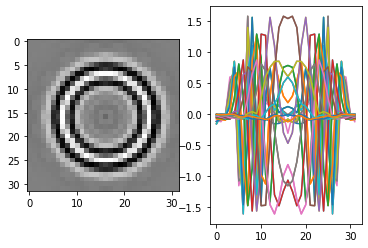

In [18]:
coefs = torch.zeros((n_sublevel, n_azimuth, n_theta, n_phase))
coefs[:, :, :1, 1] = torch.ones((n_sublevel, n_azimuth, 1))
img_dis = torch.tensordot(K, coefs, dims=4)
plt.subplot(1,2,1)
plt.imshow(img_dis.numpy(), cmap='gray')
plt.subplot(1,2,2)
_=plt.plot(img_dis.numpy())

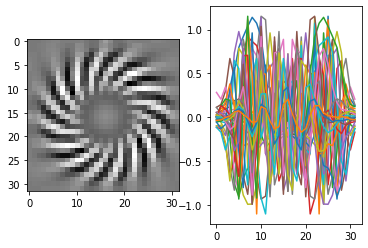

In [19]:
coefs = torch.zeros((n_sublevel, n_azimuth, n_theta, n_phase))
coefs[:, :, 2:3, 0] = torch.ones((n_sublevel, n_azimuth, 1))
img_dis = torch.tensordot(K, coefs, dims=4)
plt.subplot(1,2,1)
plt.imshow(img_dis.numpy(), cmap='gray')
plt.subplot(1,2,2)
_=plt.plot(img_dis.numpy())

Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


<Figure size 432x288 with 0 Axes>

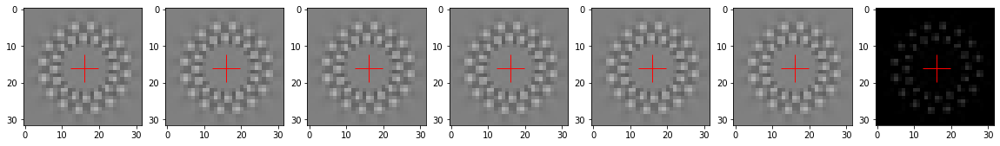

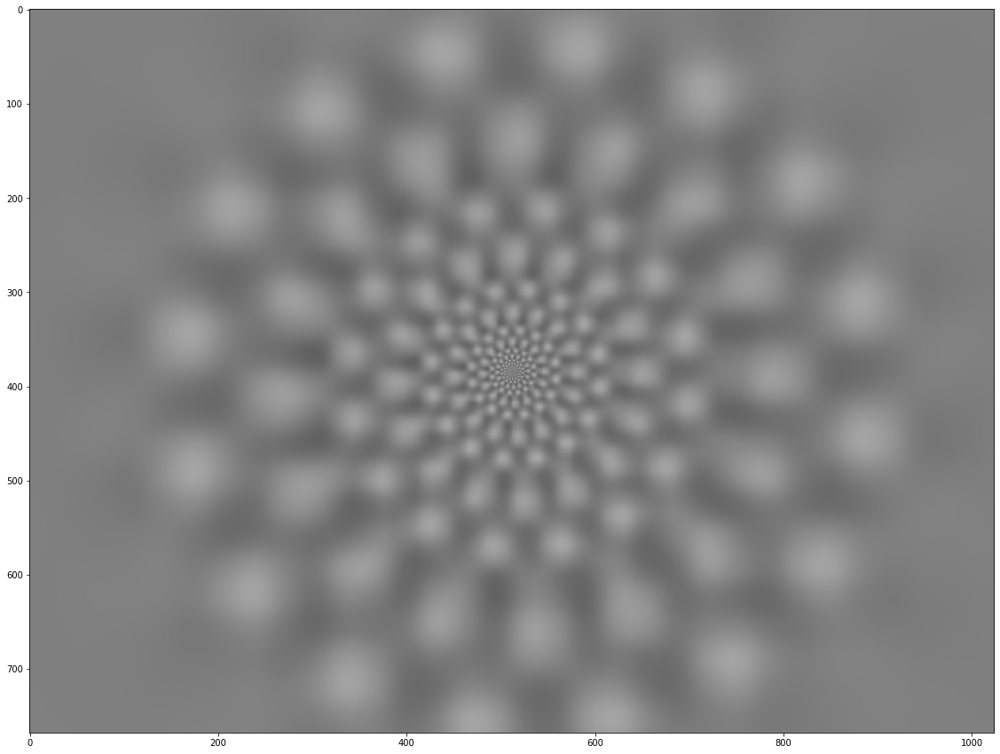

In [20]:
log_gabor_rosace = 100 * torch.ones(1, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase)

plt.figure()

img_crop_rosace=inverse_gabor(log_gabor_rosace, K_inv_rcond)
axs = tensor_pyramid_display(img_crop_rosace)
img_crop_rosace[:,-1,...] = 128 
full_rosace = inverse_pyramid(img_crop_rosace, color=color, gauss=gauss, n_levels=n_levels)
full_rosace = full_rosace.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)
plt.figure(figsize=(20,15))
plt.imshow(full_rosace[0,:])


### Images dataset + transforms

In [21]:
if not os.path.exists("image_names.txt"):
    names = open("image_names.txt", "w")
    img_names = os.listdir('../ALLSTIMULI')
    print('EXCLUDED:')
    for i in range(len(img_names)):
        if '2218506905' in img_names[i] or 'Data2' in img_names[i] \
            or 'Data3' in img_names[i] or 'Data4' in img_names[i] \
            or 'DS_' in img_names[i] or len(img_names[i])<=10\
            or 'i24622350' in img_names[i]:
            print(img_names[i])
        else:
            names.write(img_names[i][:-5]+'\n')
    names.close()
    
names = open("image_names.txt", "r")
img_names = names.readlines()
for i in range(len(img_names)):
    img_names[i]=img_names[i][:-1]

In [22]:
loc_data_xy={}
for name in img_names:
    locpath_train = '../data/loc_data/train/' + name
    locpath_test = '../data/loc_data/test/' + name
    try:
        f = open(locpath_train,'rb')
    except:
        f = open(locpath_test,'rb')
    loc_dict = pickle.load(f)
    loc_data_xy[name] = np.array(loc_dict['barycenters'])

In [23]:
def show_landmarks(image, landmarks):
    """Show image with landmarks"""
    plt.imshow(image)
    plt.scatter(landmarks[:, 0], landmarks[:, 1], s=10, marker='.', c='r')
    #plt.pause(0.001)  # pause a bit so that plots are updated

# Dataset class

In [24]:
class SaccadeLandmarksDataset(Dataset):
    """Saccade Landmarks dataset."""

    def __init__(self, loc_dict, img_dir, img_names, transform=None, color_mode='rgb'):
        """
        Args:
            loc_dict (dict): Dictonary containing saccade coordinates
            img_dir (string): Directory with all the images.
            img_names (lost): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.loc_dict = loc_dict
        self.img_dir = img_dir
        self.img_names = img_names
        self.transform = transform
        self.color_mode=color_mode

    def __len__(self):
        return len(self.loc_dict)

    def __getitem__(self, idx, color_mode='rgb'):

        #img_name = os.listdir(self.img_dir)[idx+2]
        name = self.img_names[idx]
        img_path = os.path.join(self.img_dir, name + '.jpeg')
        image = io.imread(img_path)
        #if self.color_mode == 'hsv':
        #    image = rgb2hsv(image)
        #elif self.color_mode == 'lab':
        #    image = rgb2lab(image)
        #name = img_name[:-5]
        landmarks = self.loc_dict[name]
        landmarks = np.array([landmarks])
        landmarks = landmarks.reshape(-1, 2) #.astype('float').reshape(-1, 2)
        sample = {'image': image, 'landmarks': landmarks, 'name':name}

        if self.transform:
            sample = self.transform(sample)

        return sample

# Transforms

In [25]:
class RandomSaccadeTo(object):
    def __call__(self, sample):
        image, landmarks = sample['image'], sample['landmarks']
        nb_sac = len(landmarks)
        sac_num =  np.random.randint(nb_sac)
        sac = landmarks[sac_num]
        N_X, N_Y = image.shape[:2]
        #img_color_sac = saccade_to(image, (N_X//2, N_Y//2), (sac[1], sac[0]))
        image_roll = np.copy(image)
        image_roll=np.roll(image_roll, N_X//2 - sac[1], axis=0)
        image_roll=np.roll(image_roll, N_Y//2 - sac[0], axis=1)
        return {'image':image_roll, 'pos':sac, 'name':sample['name']}

In [26]:
class ToTensor(object):
    """Convert ndarrays in sample to Tensors."""

    def __call__(self, sample):

        # swap color axis because
        # numpy image: H x W x C
        # torch image: C X H X W
        image_tens = sample['image'].transpose((2, 0, 1))
        return {'image': torch.FloatTensor(image_tens), 'pos': sample['pos'],  'name':sample['name']}

### Adapted cropped pyramid (squeezed tensor)

In [27]:
class CroppedPyramid(object):
    def __init__(self, width, 
                 base_levels, 
                 color=color, 
                 do_mask=do_mask, 
                 verbose=False, 
                 n_levels=None, 
                 color_mode='rgb'):
        self.width = width
        self.base_levels = base_levels
        self.color = color
        self.do_mask = do_mask
        self.verbose = verbose
        self.n_levels = n_levels
        self.color_mode = color_mode
    
    def __call__(self, sample):
        img_crop, level_size = cropped_pyramid(sample['image'].unsqueeze(0), 
                                               width=self.width, 
                                               base_levels=self.base_levels,
                                               color=self.color, 
                                               do_mask=self.do_mask, 
                                               verbose=self.verbose,
                                               squeeze=True,
                                               gauss=gauss,
                                               n_levels=self.n_levels,
                                               color_mode=self.color_mode)
        #img_crop[:,-1,...]-=128 # on residual (!!)
        return{'img_crop':img_crop, 'level_size':level_size, 'pos':sample['pos'],  'name':sample['name']}
        
    

### LogGaborTransform

In [28]:
class LogGaborTransform(object):
    def __init__(self, K=K, color=color, verbose=False):
        self.K = K
        self.color = color
        self.verbose = verbose
    
    def __call__(self, sample):
        log_gabor_coeffs = log_gabor_transform(sample['img_crop'].unsqueeze(0), K)
        
        return{'img_gabor':log_gabor_coeffs, 'pos':sample['pos'],  'name':sample['name']}

### ComplexModulus

# Compose transforms
### transforms.Compose

In [29]:
composed_transform = transforms.Compose([RandomSaccadeTo(),
                               ToTensor(),
                               CroppedPyramid(width, 
                                              base_levels, 
                                              n_levels=n_levels,
                                              color_mode=color_mode)]) #, LogGaborTransform()])

In [30]:
saccade_dataset = SaccadeLandmarksDataset(loc_dict=loc_data_xy,
                                          img_dir='../ALLSTIMULI/',
                                          img_names=img_names,
                                          transform=composed_transform,
                                          color_mode=color_mode)

# Iterating through the dataset

In [31]:
# Helper function to show a batch

'''def tensor_hsv_to_rgb(images_batch):
    n_batch, n_levels = images_batch.shape[:2]
    for batch in range(n_batch):
        for level in range(n_levels):
            im_hsv = 
'''
def show_landmarks_batch(sample_batched, color_mode='rgb'):
    """Show image with landmarks for a batch of samples."""
    for level in range(n_levels-1,0,-1):
        plt.figure()
        images_batch = torch.clone(sample_batched['img_crop'][:,level,:,:,:])
        if level < n_levels-1 and not gauss:
            images_batch+=128  
        batch_size = len(images_batch)
        im_size = images_batch.size(2)
        grid_border_size = 2

        grid = utils.make_grid(images_batch)
        #grid += 128
        plt.imshow(grid.numpy().transpose((1, 2, 0)).clip(0,255).astype('uint8'))

        plt.title('Batch from dataloader, level=' + str(level))


0 torch.Size([4, 7, 3, 32, 32])
0 ['i1025132509', 'i2132553812', 'i2289665173', 'i2286040943']
1 torch.Size([4, 7, 3, 32, 32])
1 ['i2307207961', 'i2199606749', 'i1011319098', 'i1773927318']
2 torch.Size([4, 7, 3, 32, 32])
2 ['i2141312562', 'i1252592787', 'i2260967221', 'i1260655983']
3 torch.Size([4, 7, 3, 32, 32])
3 ['i2186383189', 'i1235260142', 'i1074021825', 'i2291750140']


<Figure size 432x288 with 0 Axes>

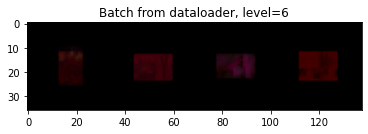

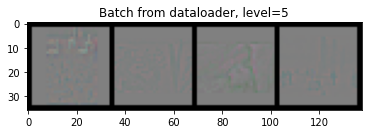

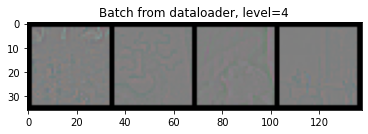

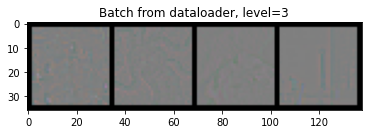

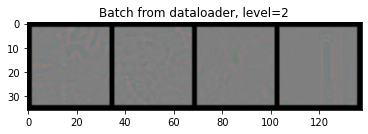

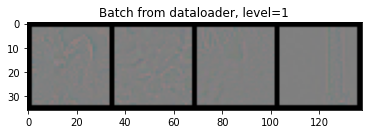

In [32]:
batch_size = 4
dataloader = DataLoader(saccade_dataset, batch_size=batch_size,
                        shuffle=True, num_workers=0)
for i_batch, sample_batched in enumerate(dataloader):
    print(i_batch, sample_batched['img_crop'].size())
    print(i_batch, sample_batched['name'])
    if i_batch ==3 :
        plt.figure()
        show_landmarks_batch(sample_batched)  
        break
        

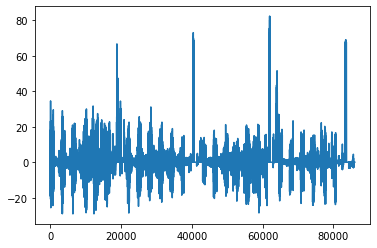

In [33]:
plt.plot(sample_batched['img_crop'].flatten())

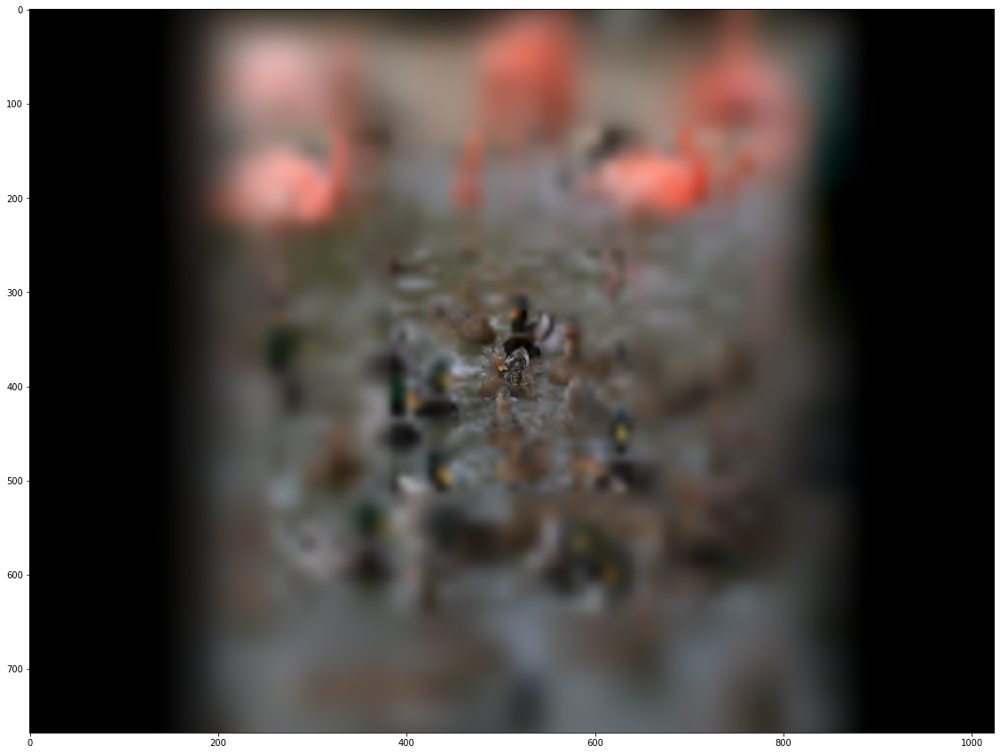

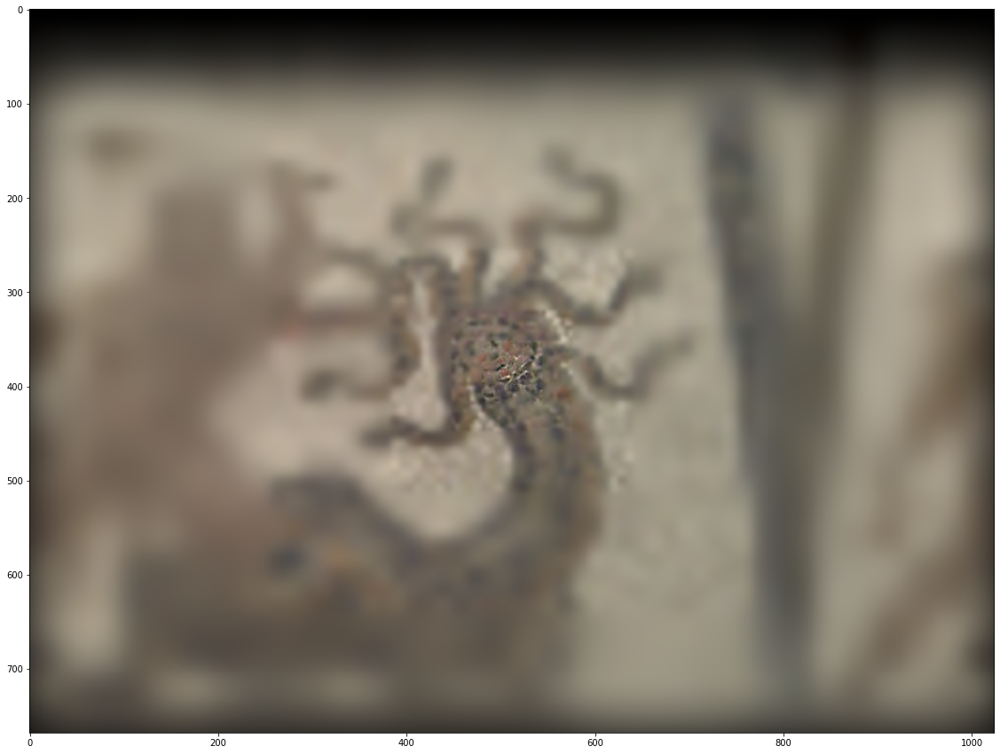

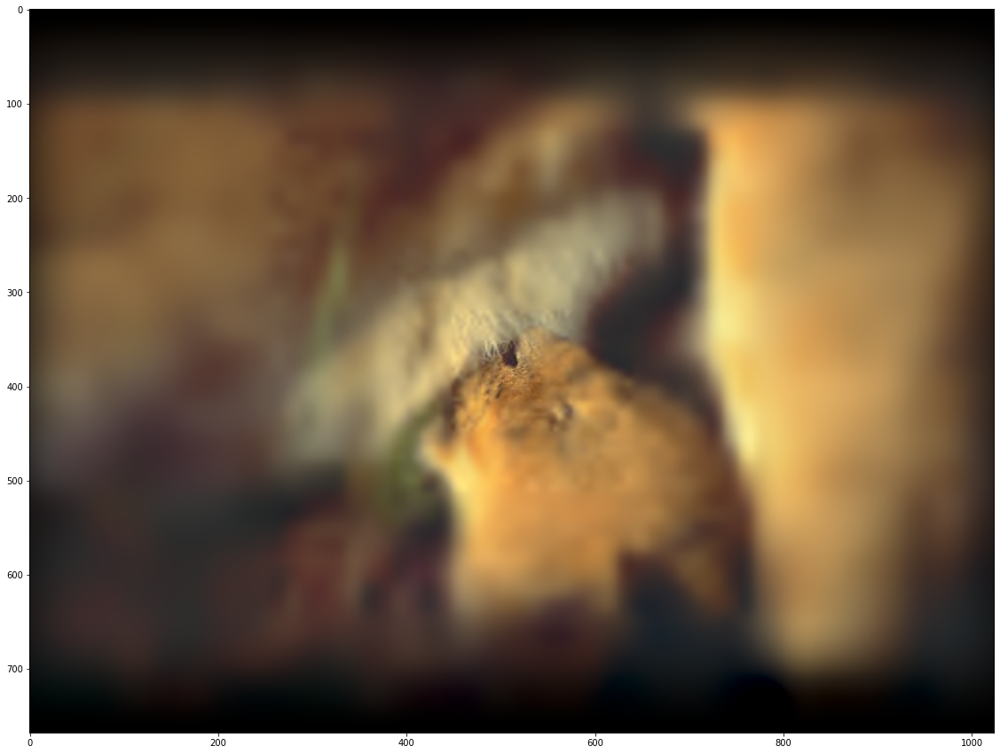

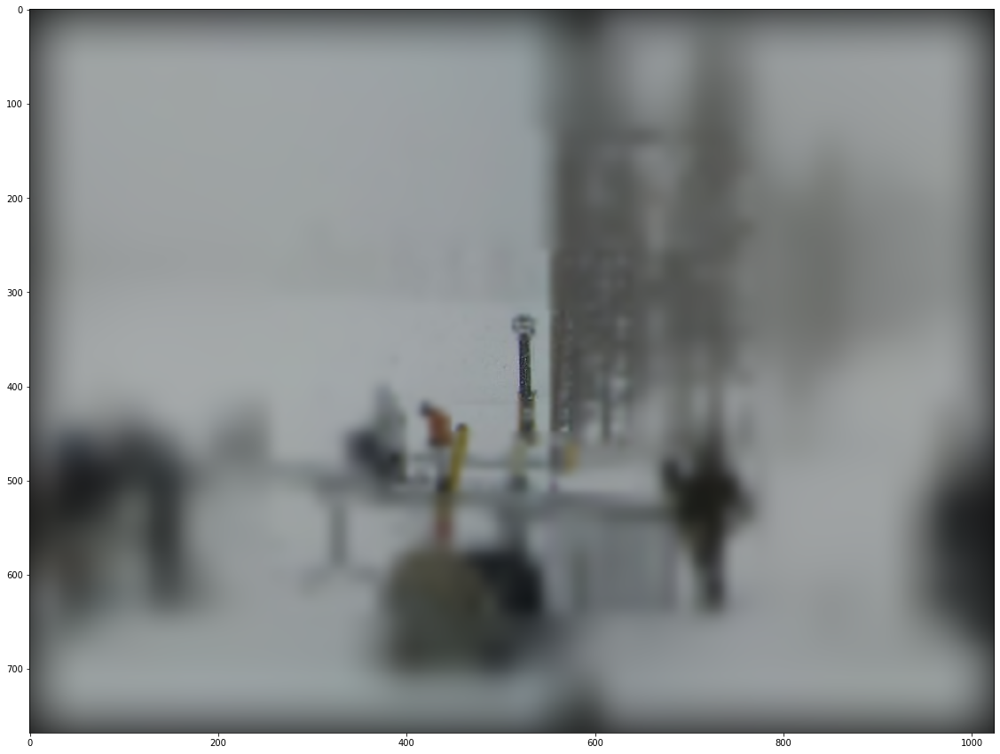

In [34]:
full_img_rec = inverse_pyramid(sample_batched['img_crop'], 
                               color=color, 
                               gauss=gauss, 
                               n_levels=n_levels)
if color_mode=='hsv' or color_mode=='lab':
    im = full_img_rec.detach().permute(0,2,3,1).numpy()
else:
    im = full_img_rec.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
for num_batch in range(batch_size):
    plt.figure(figsize=(20,15))
    if color_mode == 'hsv':
        plt.imshow(hsv2rgb(im[num_batch,:]))
    elif color_mode == 'lab':
        plt.imshow(lab2rgb(im[num_batch,:]))
    else:
        plt.imshow(im[num_batch,:])

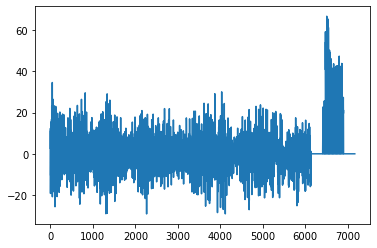

In [35]:
plt.plot(sample_batched['img_crop'][0,:,0,:,:].flatten())

## Encoding and decoding

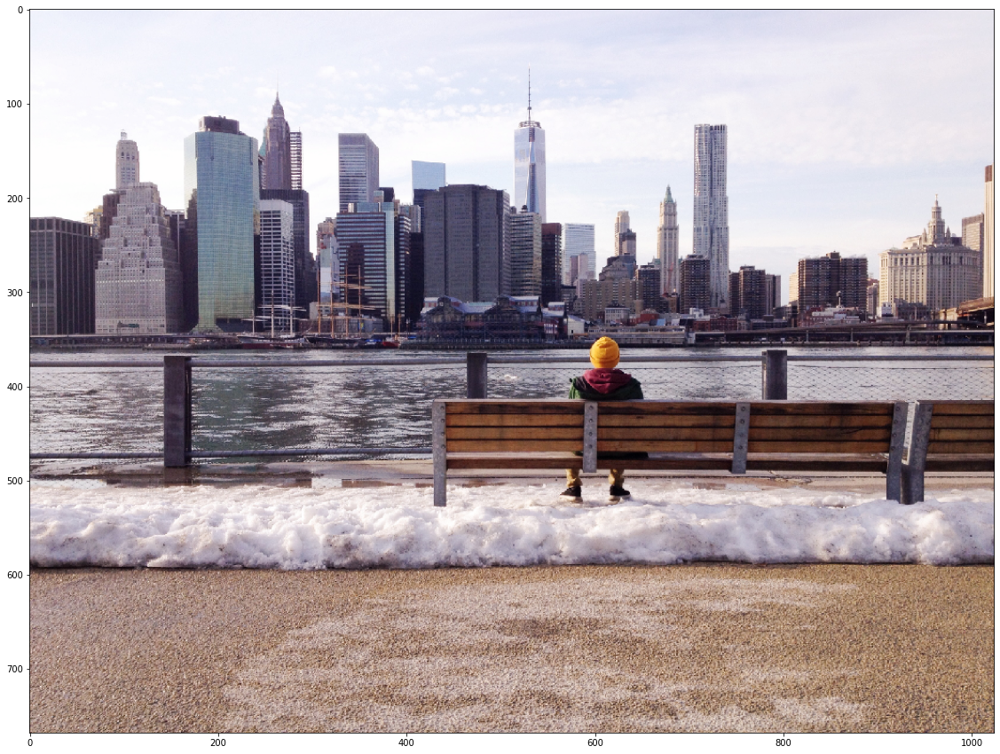

In [36]:
locpath = '../ALLSTIMULI/' + img_names[10] + '.jpeg'
img_orig = Image.open(locpath) 

locpath= '../data/professional_test/test/namphuong-van-260.png'
#locpath= '../data/professional_test/test/shannon-kelley-108053.png'
img_orig = Image.open(locpath).resize((1024,768)) 

'''if hsv:
    img_orig = img_orig.convert("HSV")

img_orig = io.imread(locpath)
'''
plt.figure(figsize=(20,15))
if color_mode=='hsv':
    img_orig = rgb2hsv(img_orig)
    plt.imshow(hsv2rgb(img_orig))
elif color_mode=='lab':
    img_orig = rgb2lab(img_orig)
    plt.imshow(lab2rgb(img_orig))
else:
    plt.imshow(img_orig)

In [37]:
img_tens = torch.Tensor(np.array(img_orig)[None,...]).permute(0,3,1,2)

In [38]:
img_crop = cropped_pyramid(img_tens, 
                           width=width, 
                           color=color, 
                           do_mask=do_mask,
                           verbose=True, 
                           gauss=gauss, 
                           n_levels=n_levels)[0]

Tensor shape= torch.Size([1, 3, 384, 512]) , shape= torch.Size([1, 3, 768, 1024])
Tensor shape= torch.Size([1, 3, 192, 256]) , shape= torch.Size([1, 3, 384, 512])
Tensor shape= torch.Size([1, 3, 96, 128]) , shape= torch.Size([1, 3, 192, 256])
Tensor shape= torch.Size([1, 3, 48, 64]) , shape= torch.Size([1, 3, 96, 128])
Tensor shape= torch.Size([1, 3, 24, 32]) , shape= torch.Size([1, 3, 48, 64])
Tensor shape= torch.Size([1, 3, 12, 16]) , shape= torch.Size([1, 3, 24, 32])
Top tensor shape= torch.Size([1, 3, 12, 16]) , Final n_levels= 7


In [39]:
img_crop.shape

torch.Size([1, 7, 3, 32, 32])

In [40]:
log_gabor_coeffs = log_gabor_transform(img_crop, K)
log_gabor_coeffs.shape

torch.Size([1, 7, 3, 2, 16, 8, 2])

## Reconstruction tests

### Pyramid reconstruction

Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


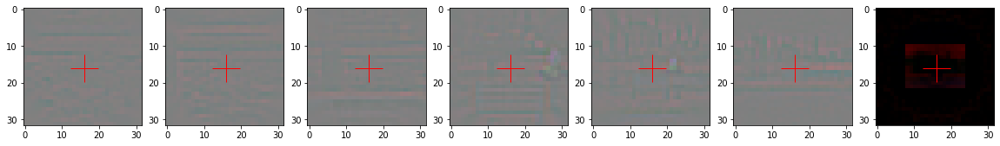

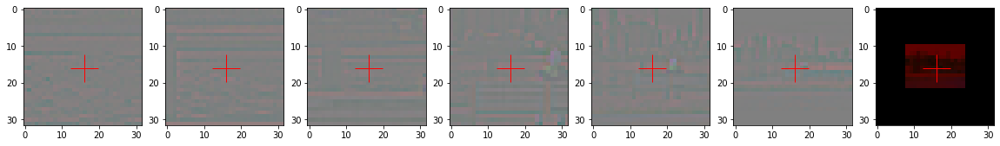

In [41]:
img_rec=inverse_gabor(log_gabor_coeffs.detach(), K_inv)
img_rec_clone = img_rec.clone()
img_crop_clone = img_crop.clone()
axs = tensor_pyramid_display(img_rec_clone)
axs = tensor_pyramid_display(img_crop_clone)

### Full image reconstruction

In [42]:
def image_show(im, color_mode):
    if color_mode=='hsv':
        plt.imshow(hsv2rgb(im))
    elif color_mode=='lab':
        plt.imshow(lab2rgb(im))
    else:
        full_img_rec = im.clip(0,255).astype('uint8')
        plt.imshow(im)

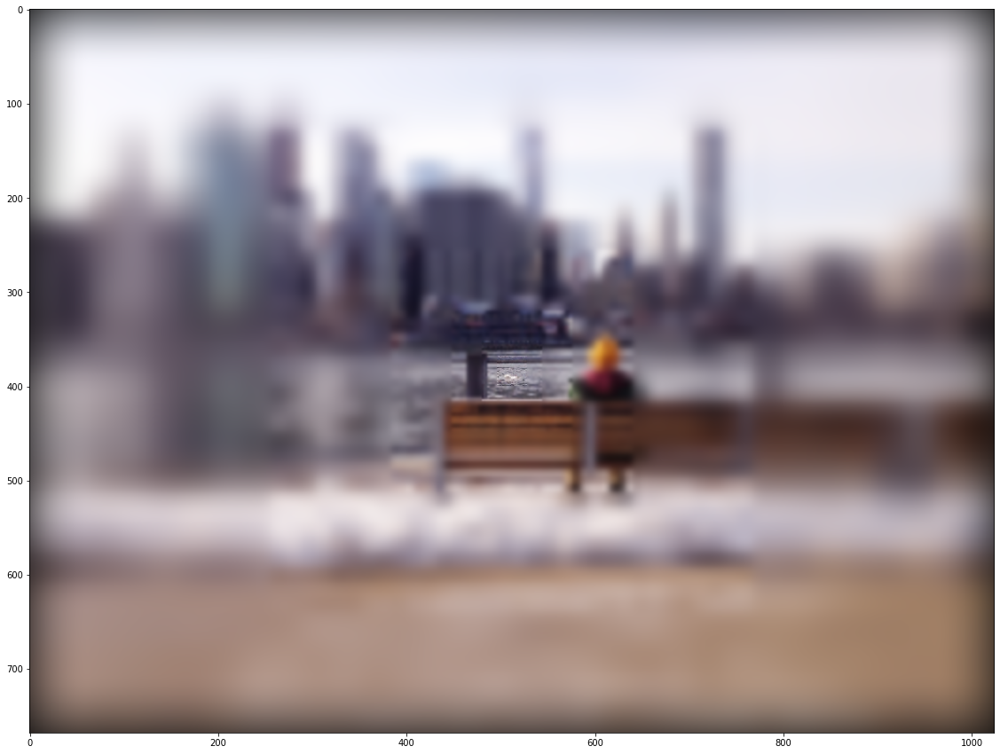

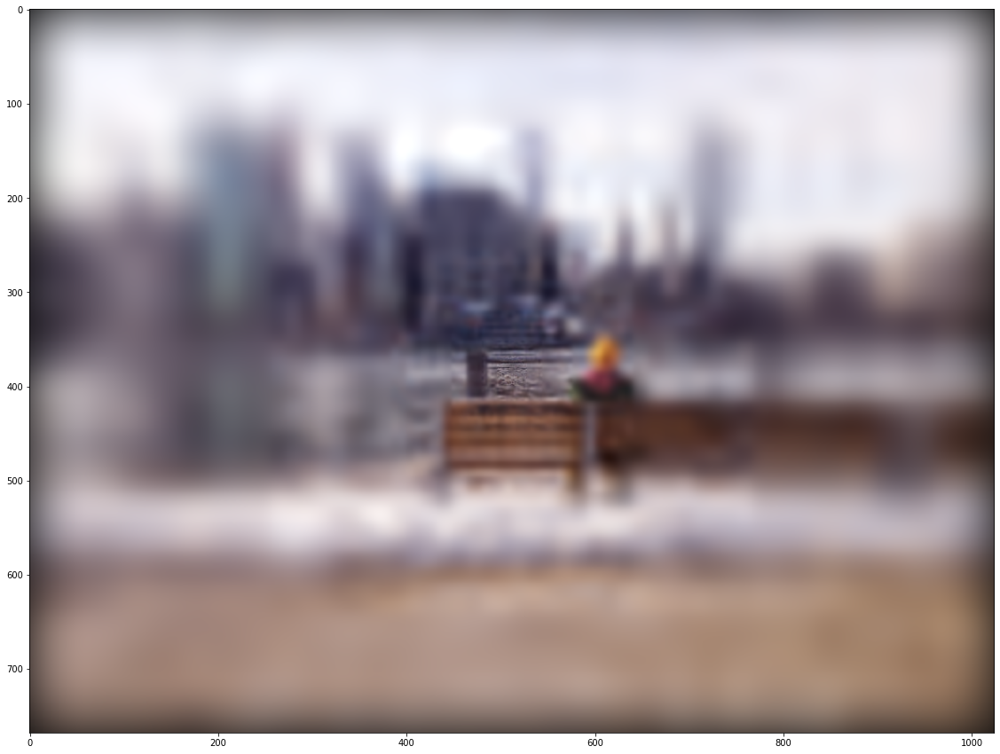

In [43]:
img_pyr_rec = inverse_pyramid(img_crop, color=color, gauss=gauss, n_levels=n_levels)
img_pyr_rec = img_pyr_rec.detach().permute(0,2,3,1).numpy()
if color_mode=='rgb':
    img_pyr_rec = img_pyr_rec.clip(0,255).astype('uint8')

if True:
    img_rec[:,-1,...]= img_crop[:,-1,...]
    
img_lg_rec = inverse_pyramid(img_rec, color=color, gauss=gauss, 
                             n_levels=n_levels, color_test = False)
img_lg_rec = img_lg_rec.detach().permute(0,2,3,1).numpy()
if color_mode == 'rgb':
    img_lg_rec = img_lg_rec.clip(0,255).astype('uint8')

plt.figure(figsize=(20,15))
image_show(img_pyr_rec[0,:], color_mode)
    
plt.figure(figsize=(20,15))
image_show(img_lg_rec[0,:], color_mode)


### Rotation test

In [44]:
log_gabor_coeffs.shape

torch.Size([1, 7, 3, 2, 16, 8, 2])

In [45]:
log_gabor_coeffs_roll = log_gabor_coeffs.clone()
#log_gabor_coeffs_roll[:,:n_levels-1,...]= log_gabor_coeffs_roll[:,:n_levels-1,...].roll(-4,4) #.roll(4, 4)
log_gabor_coeffs_roll= log_gabor_coeffs_roll.roll(1,4) #.roll(4, 4)
log_gabor_coeffs_roll= log_gabor_coeffs_roll.roll(1,1) #.roll(4, 4)

#log_gabor_coeffs_roll[:,:n_levels-1,...] = log_gabor_coeffs_roll[:,:n_levels-1,...].roll(1,1) #.roll(4, 4)

In [46]:
img_rec_roll=inverse_gabor(log_gabor_coeffs_roll.detach(), K_inv_rcond)
#img_rec_roll=inverse_gabor(log_gabor_coeffs_roll.detach(), K.permute(2,3,4,5,0,1))
if True:
    img_rec_roll[:,-1,...]= img_crop[:,-1,...]

Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


In [47]:
img_lg_rec_roll = inverse_pyramid(img_rec_roll, color=color, gauss=gauss, n_levels=n_levels)
img_lg_rec_roll = img_lg_rec_roll.detach().permute(0,2,3,1).numpy()
if color_mode == 'rgb':
    img_lg_rec_roll = img_lg_rec_roll.clip(0,255).astype('uint8')

Text(0.5, 1.0, 'ROTATION + ZOOM')

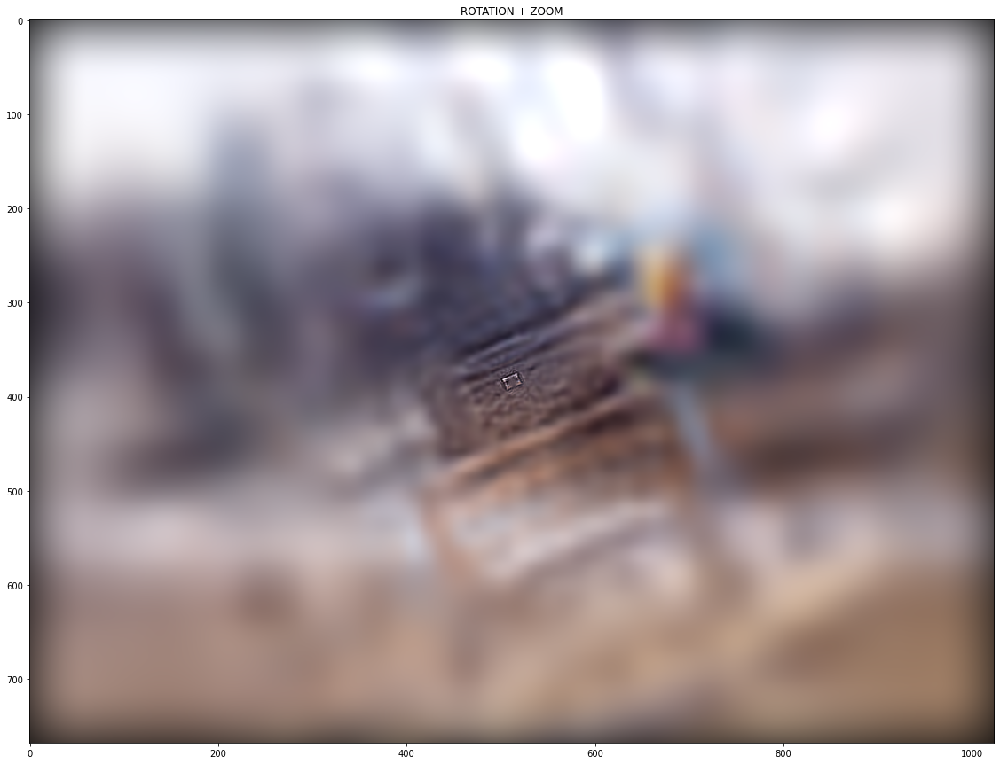

In [48]:
plt.figure(figsize=(20,15))
if color_mode=='hsv':
    plt.imshow(hsv2rgb(img_lg_rec_roll[0,:]))
elif color_mode=='lab':
    plt.imshow(lab2rgb(img_lg_rec_roll[0,:]))
else:
    plt.imshow(img_lg_rec_roll[0,:])
plt.title('ROTATION + ZOOM')

### Autoencoder

In [49]:
class AutoEncoder(nn.Module):
    def __init__(self, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan = 30):
        super(AutoEncoder, self).__init__()
        self.n_levels = n_levels
        self.n_color = n_color
        self.n_eccentricity = n_eccentricity 
        self.n_azimuth = n_azimuth 
        self.n_theta = n_theta
        self.n_phase = n_phase
        self.out_chan = out_chan
        self.encoder = Encoder(n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan)
        self.decoder = Decoder(n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan)

    def forward(self, x, **kargs):               
        x, indices1, indices2 = self.encoder(x)
        return self.decoder(x, indices1, indices2) 

In [50]:
class Encoder(nn.Module):
    """ Encoder
    """
    def __init__(self, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan = 300):
        super(Encoder, self).__init__()
        self.n_levels = n_levels
        self.n_color = n_color
        self.n_eccentricity = n_eccentricity 
        self.n_azimuth = n_azimuth 
        self.n_theta = n_theta
        self.n_phase = n_phase
        # Layers
        self.conv1 = nn.Conv3d(  n_color * n_phase, 
                                 10, 
                                 kernel_size = (3,3,3), 
                                 stride = 1,
                                 padding = (1,1,1),
                                 padding_mode = 'circular')
        self.pool1 = nn.MaxPool3d(kernel_size = (2,2,2), 
                                 stride = (2,2,2),
                                 padding = (0,0,0),
                                 return_indices=True)
        self.conv2 = nn.Conv3d(  10, 
                                 20, 
                                 kernel_size = (3,3,3), 
                                 stride = 1, 
                                 padding = (1,1,1),
                                 padding_mode = 'circular')
        self.pool2 = nn.MaxPool3d(kernel_size = (2,2,2), 
                                 stride = (2,2,2),
                                 padding = (0,0,0),
                                 return_indices=True)
        self.h_size = 100 * n_azimuth // 4 * (n_levels * n_eccentricity // 4 - 1)
        self.fc1 = nn.Linear(self.h_size , self.h_size )
        self.fc2 = nn.Linear(self.h_size , out_chan)
            
    def forward(self, x): 
        x = x.permute(0, 2, 6, 1, 3, 4, 5).contiguous()
        x = x.view(-1, self.n_color * self.n_phase, self.n_levels * self.n_eccentricity, self.n_azimuth, self.n_theta)
        x = self.conv1(x)
        x, indices1 = self.pool1(x)
        x = nn.ReLU()(x)
        x = self.conv2(x)
        x, indices2 = self.pool2(x)
        x = nn.ReLU()(x)
        #x = x.reshape(-1, self.h_size )
        #x = self.fc1(x)
        #x = nn.ReLU()(x)
        #x = self.fc2(x)
        return x, indices1, indices2

In [51]:
out_chan = 30
enc = Encoder(n_levels - 1, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan=out_chan)
dataloader = DataLoader(saccade_dataset, batch_size=batch_size,
                        shuffle=True, num_workers=0)
data = next(iter(dataloader))  
log_gabor_coefs = log_gabor_transform(data['img_crop'], K)
autoenc_inputs = log_gabor_coefs[:,:n_levels-1,...].clone()
autoenc_inputs /=  256 # !! Normalization
code, indices1, indices2 = enc(autoenc_inputs)

In [52]:
class Decoder(nn.Module):
    """ Encoder
    """
    def __init__(self, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan = 300):
        super(Decoder, self).__init__()
        self.n_levels = n_levels
        self.n_color = n_color
        self.n_eccentricity = n_eccentricity 
        self.n_azimuth = n_azimuth 
        self.n_theta = n_theta
        self.n_phase = n_phase
        self.h_size = 100 * n_azimuth // 4 * n_levels * n_eccentricity // 4
        # Layers  
        self.h_height = n_levels * n_eccentricity  // 4
        self.h_width = n_azimuth // 2
        self.fc1 = nn.Linear(out_chan, self.h_size)               
        self.fc2 = nn.Linear(self.h_size, self.h_size)             
        
        self.unpool1 = nn.MaxUnpool3d(kernel_size = (2,2,2), 
                                 stride = (2,2,2),
                                 padding = (0,0,0))
        self.unconv1 = nn.ConvTranspose3d(  20, 
                                 10, 
                                 kernel_size = (3,3,3), 
                                 stride = 1, 
                                 padding = (1,1,1),
                                 output_padding=(0,0,0))         
        self.unpool2 = nn.MaxUnpool3d(kernel_size = (2,2,2), 
                                 stride = (2,2,2),
                                 padding = (0,0,0))
        self.unconv2 = nn.ConvTranspose3d(  10, 
                                 n_color * n_phase, 
                                 kernel_size = (3,3,3), 
                                 stride = 1, 
                                 padding = (1,1,1),
                                 output_padding=0)
            
    def forward(self, x, indices1, indices2):   
        '''
        x = self.fc1(x)
        x = nn.ReLU()(x)
        x = self.fc2(x)
        x = x.reshape(-1, 200, self.h_height, self.h_width)
        x = nn.ReLU()(x)
        '''
        x = self.unpool1(x, indices2)
        x = self.unconv1(x)
        x = nn.ReLU()(x)
        x = self.unpool2(x, indices1)
        x = self.unconv2(x)
        x = x.view(-1, self.n_color, self.n_phase, self.n_levels, self.n_eccentricity, self.n_azimuth, self.n_theta)
        x = x.permute(0, 3, 1, 4, 5, 6, 2).contiguous()
        return x

#### Tests

In [53]:
dec = Decoder(n_levels - 1, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan=out_chan)
dec_out = dec(code, indices1, indices2)
dec_out.shape

torch.Size([4, 6, 3, 2, 16, 8, 2])

In [54]:
class InverseLogGaborMapper(nn.Module):
    def __init__(self, in_chan = n_eccentricity * n_azimuth * n_theta * n_phase, 
                 out_chan = width * width):
        super(InverseLogGaborMapper, self).__init__()
        self.inverseMap = nn.Linear(in_chan, out_chan)
        
    def forward(self, x, **kargs):
        out = self.inverseMap(x) #!!
        return out #!!

### Model and learning params

In [55]:
batch_size=15
autoenc_lr = 1e-4
invLG_lr = 3e-5

n_epoch = 1000
recording_steps = 10

In [56]:
autoenc = AutoEncoder(n_levels - 1, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, out_chan=out_chan)
invLGmap = InverseLogGaborMapper()

In [57]:
autoenc_optimizer = optim.Adam(autoenc.parameters(), lr = autoenc_lr)
        
invLG_optimizer = optim.Adam(invLGmap.parameters(), lr = invLG_lr)

criterion = nn.MSELoss() #loss = criterion(outputs, inputs)

In [58]:
dataloader = DataLoader(saccade_dataset, batch_size=batch_size,
                        shuffle=True, num_workers=0)

In [59]:
autoenc_loss_list = []
invLG_loss_list = []

In [60]:
PATH = script_name + '_invLGmap.pt'

if not os.path.exists(PATH):    

    for epoch in range(n_epoch):  # loop over the dataset multiple times

        autoenc_running_loss = 0.0
        invLG_running_loss = 0.0
        for step, data in enumerate(dataloader):

            batch_size_eff = data['img_crop'].shape[0]
            
            log_gabor_coefs = log_gabor_transform(data['img_crop'], K)

            # Normalizing
            autoenc_inputs = log_gabor_coefs[:,:n_levels-1,...].clone()
            if color_mode == 'rgb':
                autoenc_inputs /=  256 # !! Normalization
            autoenc_outputs = autoenc(autoenc_inputs)
            
            autoenc_optimizer.zero_grad()
            autoenc_loss = criterion(autoenc_outputs, autoenc_inputs)
            autoenc_loss.backward()
            autoenc_optimizer.step()

            invLG_optimizer.zero_grad()
            log_gabor_coefs_rec = autoenc_outputs.detach().view(batch_size_eff*(n_levels-1)*n_color,
                                                               n_eccentricity*n_azimuth*n_theta*n_phase)
            img_pyr_rec_rec = invLGmap(log_gabor_coefs_rec)

            img_pyr_targets = data['img_crop'][:,:n_levels-1,...].contiguous()
            img_pyr_targets = img_pyr_targets.view(batch_size_eff * (n_levels-1) * n_color, 
                                                   width * width)
            if color_mode == 'rgb':
                img_pyr_targets /=  256 # !! Normalization
            invLG_loss = criterion(img_pyr_rec_rec, img_pyr_targets)
            invLG_loss.backward()             
            invLG_optimizer.step()

            # print statistics
            autoenc_running_loss += autoenc_loss.item()
            invLG_running_loss += invLG_loss.item()
            if (step+1)%recording_steps == 0 :    # print every n_steps mini-batches
                print('[%d, %5d] losses: %.3f, %.3f' %
                      (epoch + 1, step + 1, 100 * autoenc_running_loss/recording_steps, 
                                         1000 * invLG_running_loss/recording_steps))
                #.append
                autoenc_loss_list.append(autoenc_running_loss/recording_steps)
                autoenc_running_loss = 0.0
                invLG_loss_list.append(invLG_running_loss/recording_steps)
                invLG_running_loss = 0.0

    print('Finished Training ')
    
    if n_epoch !=0 :
        PATH = script_name + '_autoenc_loss_list.npy'
        np.save(PATH, np.array(autoenc_loss_list))    
        PATH = script_name + '_invLG_loss_list.npy'
        np.save(PATH, np.array(invLG_loss_list))   
        PATH = script_name + '_invLGmap.pt'
        torch.save(invLGmap, PATH)
        PATH = script_name + '_autoenc.pt'
        torch.save(autoenc, PATH)
        print('Model saved')

else:
    PATH = script_name + '_autoenc_loss_list.npy'
    autoenc_loss_list = np.load(PATH)    
    PATH = script_name + '_invLG_loss_list.npy'
    invLG_loss_list = np.load(PATH)
    PATH = script_name + '_invLGmap.pt'
    invLGmap = torch.load(PATH)
    PATH = script_name + '_autoenc.pt'
    autoenc = torch.load(PATH)
    print('Model loaded')

[1,    10] losses: 21969.888, 16769.456
[1,    20] losses: 22004.585, 16455.533
[1,    30] losses: 22399.002, 17009.746
[1,    40] losses: 24302.750, 18710.323
[1,    50] losses: 24541.724, 18984.565
[1,    60] losses: 20552.040, 15875.330
[2,    10] losses: 21483.640, 16565.867
[2,    20] losses: 24817.073, 19560.548
[2,    30] losses: 20762.724, 16855.135
[2,    40] losses: 21458.283, 17725.859
[2,    50] losses: 22781.436, 19465.102
[2,    60] losses: 22321.077, 19433.980
[3,    10] losses: 21043.827, 19240.562
[3,    20] losses: 22270.874, 21154.703
[3,    30] losses: 22028.394, 21749.038
[3,    40] losses: 20646.186, 21003.352
[3,    50] losses: 21004.350, 21900.888
[3,    60] losses: 21973.727, 23705.324
[4,    10] losses: 19524.374, 22409.393
[4,    20] losses: 21061.971, 25001.779
[4,    30] losses: 21102.553, 26950.731
[4,    40] losses: 21056.006, 26600.802
[4,    50] losses: 19108.370, 25024.662
[4,    60] losses: 18394.995, 24252.551
[5,    10] losses: 19383.075, 26395.577


[34,    50] losses: 12630.118, 16247.806
[34,    60] losses: 13089.959, 16588.868
[35,    10] losses: 12734.959, 16554.480
[35,    20] losses: 12663.541, 16374.901
[35,    30] losses: 12688.448, 16854.722
[35,    40] losses: 12587.877, 16109.415
[35,    50] losses: 12925.979, 17036.932
[35,    60] losses: 12572.676, 16278.527
[36,    10] losses: 12804.580, 16759.355
[36,    20] losses: 11771.242, 15492.720
[36,    30] losses: 12164.416, 15677.723
[36,    40] losses: 13032.643, 16772.312
[36,    50] losses: 13071.374, 16622.837
[36,    60] losses: 12418.800, 15748.941
[37,    10] losses: 13430.038, 17181.126
[37,    20] losses: 12284.970, 15816.011
[37,    30] losses: 12232.128, 15813.100
[37,    40] losses: 11914.970, 15227.096
[37,    50] losses: 13182.038, 17057.767
[37,    60] losses: 13256.552, 16801.858
[38,    10] losses: 13362.396, 16819.987
[38,    20] losses: 12520.788, 15960.673
[38,    30] losses: 12096.352, 15365.634
[38,    40] losses: 13627.632, 17018.559
[38,    50] loss

[68,    10] losses: 11303.855, 13590.544
[68,    20] losses: 11535.108, 14101.122
[68,    30] losses: 12278.538, 14484.607
[68,    40] losses: 11656.845, 13957.923
[68,    50] losses: 11014.873, 13347.737
[68,    60] losses: 11660.648, 13504.265
[69,    10] losses: 12381.948, 14773.469
[69,    20] losses: 11631.107, 13793.412
[69,    30] losses: 12036.370, 13921.726
[69,    40] losses: 12157.474, 14420.219
[69,    50] losses: 11454.502, 14148.985
[69,    60] losses: 12266.136, 14363.886
[70,    10] losses: 11431.279, 13378.436
[70,    20] losses: 11723.322, 14305.172
[70,    30] losses: 12064.917, 14550.552
[70,    40] losses: 11761.158, 13814.065
[70,    50] losses: 11112.364, 13340.358
[70,    60] losses: 12112.441, 14227.968
[71,    10] losses: 11949.326, 14623.420
[71,    20] losses: 11377.825, 14150.076
[71,    30] losses: 12244.597, 14433.752
[71,    40] losses: 11258.264, 13017.522
[71,    50] losses: 10717.545, 12733.947
[71,    60] losses: 11753.826, 14460.849
[72,    10] loss

[101,    30] losses: 10904.865, 12449.009
[101,    40] losses: 10834.746, 13168.389
[101,    50] losses: 12961.408, 15127.509
[101,    60] losses: 10959.538, 13335.036
[102,    10] losses: 11287.965, 13462.444
[102,    20] losses: 13223.541, 15589.946
[102,    30] losses: 10272.791, 11872.016
[102,    40] losses: 10863.588, 13230.033
[102,    50] losses: 10819.209, 13316.092
[102,    60] losses: 10710.427, 13389.088
[103,    10] losses: 11778.441, 13913.593
[103,    20] losses: 11504.014, 13586.097
[103,    30] losses: 9720.786, 11841.983
[103,    40] losses: 11540.873, 13794.927
[103,    50] losses: 10067.148, 12368.448
[103,    60] losses: 11014.483, 13363.633
[104,    10] losses: 11010.227, 13165.140
[104,    20] losses: 11110.240, 13459.436
[104,    30] losses: 9980.142, 11844.650
[104,    40] losses: 12232.505, 14560.996
[104,    50] losses: 10339.256, 12608.039
[104,    60] losses: 11081.839, 13439.770
[105,    10] losses: 12159.961, 14582.228
[105,    20] losses: 10905.541, 1288

[134,    10] losses: 10987.061, 12916.036
[134,    20] losses: 11272.198, 13718.612
[134,    30] losses: 10491.948, 12802.955
[134,    40] losses: 9820.456, 12330.636
[134,    50] losses: 10342.061, 12068.066
[134,    60] losses: 11448.557, 14390.730
[135,    10] losses: 10849.849, 13107.827
[135,    20] losses: 10820.156, 13334.592
[135,    30] losses: 11484.528, 13698.849
[135,    40] losses: 10202.330, 12627.431
[135,    50] losses: 10247.100, 12612.626
[135,    60] losses: 11243.582, 13636.880
[136,    10] losses: 11686.504, 14058.301
[136,    20] losses: 10285.992, 12317.654
[136,    30] losses: 11111.748, 13339.717
[136,    40] losses: 9821.136, 12189.883
[136,    50] losses: 10739.511, 13215.910
[136,    60] losses: 10152.661, 12484.546
[137,    10] losses: 11470.261, 13676.121
[137,    20] losses: 10968.685, 13160.664
[137,    30] losses: 9693.657, 11952.140
[137,    40] losses: 10730.812, 12920.443
[137,    50] losses: 10601.138, 13060.403
[137,    60] losses: 9933.611, 12485.

[166,    60] losses: 9777.052, 12234.862
[167,    10] losses: 9459.685, 11738.344
[167,    20] losses: 10599.492, 13197.517
[167,    30] losses: 9985.677, 12211.974
[167,    40] losses: 10116.033, 12504.717
[167,    50] losses: 10683.728, 13461.939
[167,    60] losses: 10983.074, 13108.238
[168,    10] losses: 11045.346, 13377.976
[168,    20] losses: 10060.803, 12337.072
[168,    30] losses: 9859.561, 11943.953
[168,    40] losses: 11050.518, 13173.468
[168,    50] losses: 10527.851, 12953.906
[168,    60] losses: 9533.409, 11993.457
[169,    10] losses: 10040.431, 12346.879
[169,    20] losses: 11131.504, 13709.502
[169,    30] losses: 10233.897, 12503.577
[169,    40] losses: 10310.753, 12788.359
[169,    50] losses: 9942.884, 12724.101
[169,    60] losses: 9985.907, 12359.670
[170,    10] losses: 9479.845, 11932.126
[170,    20] losses: 10499.983, 12971.544
[170,    30] losses: 10848.555, 13489.286
[170,    40] losses: 10233.965, 12631.752
[170,    50] losses: 9811.211, 12354.879
[

[199,    50] losses: 10461.764, 12937.724
[199,    60] losses: 10949.525, 13591.646
[200,    10] losses: 10233.200, 12863.337
[200,    20] losses: 11196.839, 13711.916
[200,    30] losses: 10705.154, 13647.716
[200,    40] losses: 10026.515, 12711.400
[200,    50] losses: 9244.456, 11326.664
[200,    60] losses: 10233.198, 12858.902
[201,    10] losses: 10000.469, 12270.288
[201,    20] losses: 9874.699, 12426.550
[201,    30] losses: 10352.613, 13093.632
[201,    40] losses: 9347.664, 11749.305
[201,    50] losses: 9965.901, 12629.323
[201,    60] losses: 11567.193, 13976.866
[202,    10] losses: 10307.262, 13466.630
[202,    20] losses: 10074.851, 12683.296
[202,    30] losses: 10066.962, 12534.783
[202,    40] losses: 9696.671, 12132.901
[202,    50] losses: 10542.645, 12715.613
[202,    60] losses: 9941.791, 12285.585
[203,    10] losses: 9311.837, 11703.552
[203,    20] losses: 9615.641, 11919.711
[203,    30] losses: 10168.931, 12820.822
[203,    40] losses: 9840.846, 12127.365
[

[232,    50] losses: 10358.301, 13142.681
[232,    60] losses: 10057.995, 12722.448
[233,    10] losses: 10183.515, 12992.244
[233,    20] losses: 10712.176, 13443.862
[233,    30] losses: 9545.700, 12419.723
[233,    40] losses: 9877.088, 12304.919
[233,    50] losses: 9602.017, 11886.679
[233,    60] losses: 9283.341, 11924.623
[234,    10] losses: 9420.681, 11961.628
[234,    20] losses: 10272.608, 12999.768
[234,    30] losses: 10461.899, 13114.106
[234,    40] losses: 9304.876, 11795.310
[234,    50] losses: 10842.497, 13226.350
[234,    60] losses: 10037.414, 12448.730
[235,    10] losses: 10361.338, 13659.854
[235,    20] losses: 9848.586, 12366.794
[235,    30] losses: 9633.541, 12143.926
[235,    40] losses: 9149.080, 11807.899
[235,    50] losses: 10600.390, 13098.783
[235,    60] losses: 10323.099, 13017.134
[236,    10] losses: 11283.046, 13894.226
[236,    20] losses: 9581.982, 12385.423
[236,    30] losses: 10232.374, 12946.100
[236,    40] losses: 9707.287, 12152.418
[23

[265,    50] losses: 10210.835, 12847.416
[265,    60] losses: 9639.701, 12134.777
[266,    10] losses: 10204.193, 12530.245
[266,    20] losses: 10018.583, 12591.165
[266,    30] losses: 9591.552, 12093.649
[266,    40] losses: 9797.855, 12417.208
[266,    50] losses: 8995.160, 11392.886
[266,    60] losses: 9428.102, 12074.927
[267,    10] losses: 9643.664, 12263.528
[267,    20] losses: 9354.088, 12078.721
[267,    30] losses: 10057.857, 12204.370
[267,    40] losses: 10392.924, 13203.852
[267,    50] losses: 10400.348, 13267.389
[267,    60] losses: 9124.667, 11846.204
[268,    10] losses: 10650.797, 13110.478
[268,    20] losses: 9937.487, 12497.220
[268,    30] losses: 10347.114, 12989.593
[268,    40] losses: 9731.051, 12502.245
[268,    50] losses: 9419.344, 12254.662
[268,    60] losses: 8714.478, 11192.644
[269,    10] losses: 9775.375, 12503.480
[269,    20] losses: 10309.821, 13170.692
[269,    30] losses: 10417.463, 13051.385
[269,    40] losses: 9642.619, 12381.658
[269, 

[298,    60] losses: 9803.187, 12520.747
[299,    10] losses: 9388.450, 12669.317
[299,    20] losses: 9690.614, 12204.905
[299,    30] losses: 9603.966, 12437.155
[299,    40] losses: 10258.341, 12897.777
[299,    50] losses: 9404.850, 12072.275
[299,    60] losses: 10088.818, 12783.298
[300,    10] losses: 9418.662, 12311.406
[300,    20] losses: 9706.250, 12525.165
[300,    30] losses: 8855.912, 11550.247
[300,    40] losses: 9301.160, 11869.111
[300,    50] losses: 10464.665, 13368.487
[300,    60] losses: 9744.026, 12308.734
[301,    10] losses: 9934.582, 12985.776
[301,    20] losses: 8934.217, 11278.833
[301,    30] losses: 8764.449, 11772.731
[301,    40] losses: 10007.906, 12430.602
[301,    50] losses: 10389.151, 13046.448
[301,    60] losses: 9306.062, 11602.303
[302,    10] losses: 9917.437, 12647.569
[302,    20] losses: 9750.229, 12313.724
[302,    30] losses: 9460.726, 12283.480
[302,    40] losses: 8843.117, 11615.045
[302,    50] losses: 10512.873, 13413.663
[302,    6

[332,    20] losses: 10144.253, 12627.576
[332,    30] losses: 9064.619, 11947.423
[332,    40] losses: 9212.429, 12291.985
[332,    50] losses: 9082.859, 11516.910
[332,    60] losses: 9328.488, 12413.102
[333,    10] losses: 9620.518, 12290.198
[333,    20] losses: 9052.898, 11731.411
[333,    30] losses: 9358.936, 12144.236
[333,    40] losses: 9215.311, 12139.584
[333,    50] losses: 10917.178, 13955.327
[333,    60] losses: 10570.572, 13599.558
[334,    10] losses: 10298.600, 13169.567
[334,    20] losses: 8788.920, 11250.661
[334,    30] losses: 9372.321, 12061.462
[334,    40] losses: 9077.590, 12232.504
[334,    50] losses: 11180.643, 14381.220
[334,    60] losses: 9282.385, 11971.020
[335,    10] losses: 10108.481, 13016.534
[335,    20] losses: 8776.338, 11406.686
[335,    30] losses: 9964.892, 12629.839
[335,    40] losses: 10090.497, 13028.038
[335,    50] losses: 8782.453, 11394.452
[335,    60] losses: 8431.204, 10970.026
[336,    10] losses: 9437.273, 12067.452
[336,    

[365,    40] losses: 10138.032, 13308.430
[365,    50] losses: 9722.549, 12546.629
[365,    60] losses: 9590.984, 12194.489
[366,    10] losses: 9354.979, 12321.731
[366,    20] losses: 9803.738, 12803.861
[366,    30] losses: 8833.380, 11542.455
[366,    40] losses: 8823.184, 11351.564
[366,    50] losses: 10012.993, 12839.212
[366,    60] losses: 9336.515, 12246.160
[367,    10] losses: 9309.138, 12297.939
[367,    20] losses: 9002.881, 11659.137
[367,    30] losses: 9831.587, 12652.002
[367,    40] losses: 8954.781, 11674.285
[367,    50] losses: 9742.489, 12747.954
[367,    60] losses: 9748.245, 12618.742
[368,    10] losses: 9155.028, 12182.530
[368,    20] losses: 9776.272, 12855.845
[368,    30] losses: 9108.948, 11969.830
[368,    40] losses: 8962.003, 11525.796
[368,    50] losses: 10499.984, 13436.523
[368,    60] losses: 8984.612, 11647.647
[369,    10] losses: 9192.320, 12220.138
[369,    20] losses: 9507.918, 12315.814
[369,    30] losses: 9480.319, 12658.754
[369,    40] 

[398,    60] losses: 8983.532, 11699.273
[399,    10] losses: 9086.083, 12118.634
[399,    20] losses: 9147.904, 11984.092
[399,    30] losses: 9290.751, 11875.960
[399,    40] losses: 8914.292, 11491.020
[399,    50] losses: 8669.579, 11498.576
[399,    60] losses: 9910.853, 13358.643
[400,    10] losses: 9731.567, 12631.626
[400,    20] losses: 8059.090, 10748.592
[400,    30] losses: 9677.056, 12946.060
[400,    40] losses: 9013.398, 12132.306
[400,    50] losses: 10395.977, 13032.317
[400,    60] losses: 8910.792, 11510.669
[401,    10] losses: 9292.050, 12266.116
[401,    20] losses: 9387.608, 12643.167
[401,    30] losses: 9690.154, 13182.569
[401,    40] losses: 9165.997, 12111.147
[401,    50] losses: 9536.338, 12282.732
[401,    60] losses: 8566.851, 11470.676
[402,    10] losses: 9670.871, 12589.427
[402,    20] losses: 9200.821, 12312.261
[402,    30] losses: 8624.403, 11484.917
[402,    40] losses: 9103.336, 11902.685
[402,    50] losses: 8549.933, 11494.006
[402,    60] lo

[432,    20] losses: 8784.468, 11831.979
[432,    30] losses: 9585.303, 12296.451
[432,    40] losses: 9734.257, 12833.203
[432,    50] losses: 9261.224, 12030.863
[432,    60] losses: 9547.130, 12647.377
[433,    10] losses: 9125.510, 12043.881
[433,    20] losses: 10394.262, 13373.168
[433,    30] losses: 9358.802, 12099.582
[433,    40] losses: 8863.331, 11731.663
[433,    50] losses: 9317.917, 12322.738
[433,    60] losses: 8520.931, 11413.050
[434,    10] losses: 8428.004, 11252.777
[434,    20] losses: 9410.283, 12187.950
[434,    30] losses: 8716.863, 11445.746
[434,    40] losses: 9264.633, 12049.702
[434,    50] losses: 9644.655, 12595.649
[434,    60] losses: 8888.104, 12117.984
[435,    10] losses: 9907.890, 12738.343
[435,    20] losses: 9701.186, 12567.927
[435,    30] losses: 8719.785, 11476.121
[435,    40] losses: 9461.784, 12475.775
[435,    50] losses: 9017.161, 11752.663
[435,    60] losses: 8650.759, 11512.883
[436,    10] losses: 9484.493, 12028.964
[436,    20] lo

[465,    40] losses: 9538.765, 12656.281
[465,    50] losses: 8833.642, 11843.365
[465,    60] losses: 9233.436, 12425.491
[466,    10] losses: 9040.796, 11914.705
[466,    20] losses: 8885.646, 11850.520
[466,    30] losses: 9291.848, 12486.874
[466,    40] losses: 8999.810, 11952.120
[466,    50] losses: 9447.110, 12321.069
[466,    60] losses: 9920.040, 12805.653
[467,    10] losses: 8600.851, 11368.242
[467,    20] losses: 9074.909, 11978.651
[467,    30] losses: 8965.623, 11993.903
[467,    40] losses: 9282.095, 12375.214
[467,    50] losses: 9130.477, 12194.084
[467,    60] losses: 9486.990, 12035.165
[468,    10] losses: 8831.750, 11686.411
[468,    20] losses: 8633.700, 11505.105
[468,    30] losses: 9052.365, 11800.312
[468,    40] losses: 9107.029, 12242.049
[468,    50] losses: 9582.006, 12865.770
[468,    60] losses: 9227.039, 12415.724
[469,    10] losses: 8851.504, 11536.973
[469,    20] losses: 9613.664, 12659.968
[469,    30] losses: 8863.362, 11747.400
[469,    40] los

[498,    60] losses: 8571.354, 11197.137
[499,    10] losses: 8330.353, 11259.217
[499,    20] losses: 9940.530, 12774.758
[499,    30] losses: 8801.395, 11689.106
[499,    40] losses: 8633.772, 11891.850
[499,    50] losses: 9650.975, 12271.451
[499,    60] losses: 10204.354, 13631.416
[500,    10] losses: 9148.869, 11962.476
[500,    20] losses: 9686.777, 12825.368
[500,    30] losses: 8419.189, 11146.477
[500,    40] losses: 8966.651, 11867.015
[500,    50] losses: 8897.172, 11795.690
[500,    60] losses: 8512.225, 11571.010
[501,    10] losses: 8793.866, 11789.633
[501,    20] losses: 8971.179, 11905.030
[501,    30] losses: 9218.247, 12398.878
[501,    40] losses: 8852.162, 12134.143
[501,    50] losses: 9119.694, 12194.313
[501,    60] losses: 10126.790, 13181.609
[502,    10] losses: 9303.676, 12617.941
[502,    20] losses: 8907.702, 11974.993
[502,    30] losses: 10557.123, 13789.535
[502,    40] losses: 8450.055, 11546.947
[502,    50] losses: 9627.217, 12945.662
[502,    60] 

[532,    20] losses: 9780.709, 12716.349
[532,    30] losses: 9910.420, 13000.174
[532,    40] losses: 7878.482, 10518.419
[532,    50] losses: 8823.634, 11986.031
[532,    60] losses: 8766.504, 11667.233
[533,    10] losses: 9465.701, 12825.795
[533,    20] losses: 8209.060, 11026.429
[533,    30] losses: 8518.281, 11412.645
[533,    40] losses: 9229.773, 12150.084
[533,    50] losses: 9355.958, 12500.601
[533,    60] losses: 8862.503, 11787.652
[534,    10] losses: 9176.338, 12014.217
[534,    20] losses: 9095.354, 12274.384
[534,    30] losses: 8806.631, 12034.258
[534,    40] losses: 9484.740, 12452.017
[534,    50] losses: 9245.222, 12415.208
[534,    60] losses: 8564.294, 11443.370
[535,    10] losses: 8465.128, 11428.664
[535,    20] losses: 9311.683, 12070.040
[535,    30] losses: 9868.425, 12683.247
[535,    40] losses: 8823.956, 11625.349
[535,    50] losses: 8411.946, 11175.643
[535,    60] losses: 8547.317, 12099.036
[536,    10] losses: 8364.482, 11122.002
[536,    20] los

[565,    40] losses: 9186.500, 12321.488
[565,    50] losses: 9261.384, 12511.442
[565,    60] losses: 9861.623, 12950.074
[566,    10] losses: 8820.062, 11662.009
[566,    20] losses: 9048.012, 12257.232
[566,    30] losses: 9474.427, 12428.844
[566,    40] losses: 8030.066, 10851.634
[566,    50] losses: 8959.624, 12005.891
[566,    60] losses: 7632.596, 10580.683
[567,    10] losses: 8776.758, 11982.692
[567,    20] losses: 9827.363, 12988.574
[567,    30] losses: 8707.879, 11537.425
[567,    40] losses: 9164.854, 12230.292
[567,    50] losses: 8410.899, 11212.077
[567,    60] losses: 8684.278, 11483.313
[568,    10] losses: 8675.023, 11449.236
[568,    20] losses: 9898.411, 13212.002
[568,    30] losses: 8478.170, 11656.727
[568,    40] losses: 8425.250, 11649.701
[568,    50] losses: 9007.883, 11866.563
[568,    60] losses: 9013.054, 11834.766
[569,    10] losses: 9884.169, 13107.433
[569,    20] losses: 8983.905, 11856.682
[569,    30] losses: 8656.498, 11613.465
[569,    40] los

[598,    60] losses: 9328.925, 12445.819
[599,    10] losses: 9300.553, 12702.942
[599,    20] losses: 8587.087, 11436.986
[599,    30] losses: 8501.951, 11561.672
[599,    40] losses: 8938.145, 12073.200
[599,    50] losses: 8320.601, 11088.605
[599,    60] losses: 8669.346, 11649.246
[600,    10] losses: 9085.335, 12243.767
[600,    20] losses: 9101.328, 11742.043
[600,    30] losses: 9139.760, 12408.418
[600,    40] losses: 8381.594, 11377.607
[600,    50] losses: 8837.889, 11714.064
[600,    60] losses: 8570.904, 11981.842
[601,    10] losses: 8326.320, 11153.427
[601,    20] losses: 9906.468, 13212.580
[601,    30] losses: 8784.464, 11841.384
[601,    40] losses: 8423.184, 11672.082
[601,    50] losses: 8558.350, 11508.156
[601,    60] losses: 9139.023, 11959.460
[602,    10] losses: 9584.396, 12263.538
[602,    20] losses: 9156.778, 12170.188
[602,    30] losses: 8414.288, 11415.676
[602,    40] losses: 8459.291, 11167.846
[602,    50] losses: 8868.241, 12068.697
[602,    60] los

KeyboardInterrupt: 

In [ ]:
if False :
    PATH = script_name + '_autoenc_loss_list.npy'
    np.save(PATH, np.array(autoenc_loss_list))    
    PATH = script_name + '_invLG_loss_list.npy'
    np.save(PATH, np.array(invLG_loss_list))   
    PATH = script_name + '_invLGmap.pt'
    torch.save(invLGmap, PATH)
    PATH = script_name + '_autoenc.pt'
    torch.save(autoenc, PATH)
    print('Model saved')

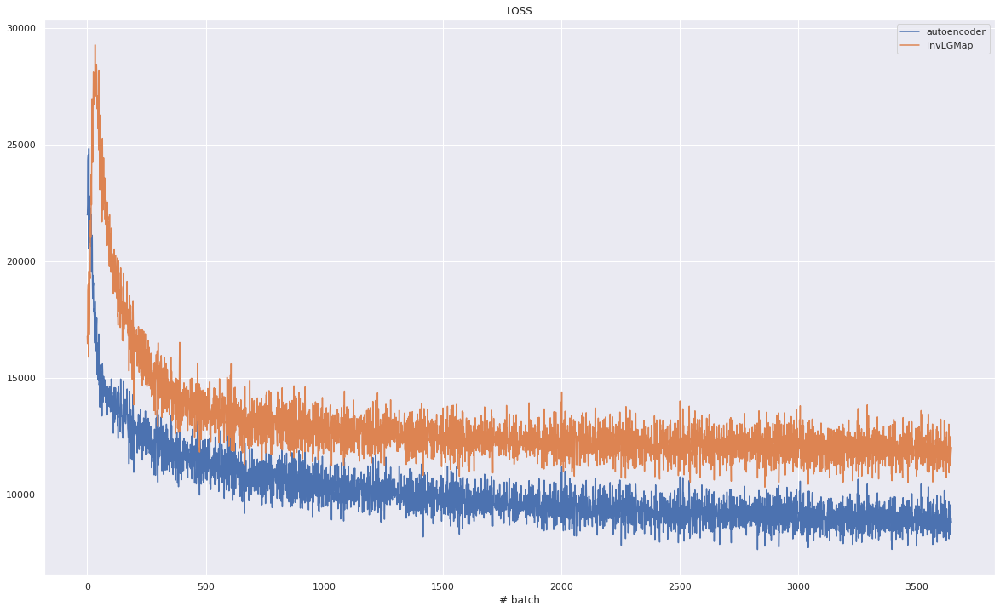

In [61]:
import seaborn
seaborn.set()
plt.figure(figsize=(20,12))
plt.plot(np.array(autoenc_loss_list) * 100, label = 'autoencoder')
plt.plot(np.array(invLG_loss_list) * 1000, label = 'invLGMap')
#plt.ylim(0,500)
plt.title('LOSS')
plt.xlabel('# batch')
plt.legend()

## Encoding and decoding

In [62]:
seaborn.reset_orig()

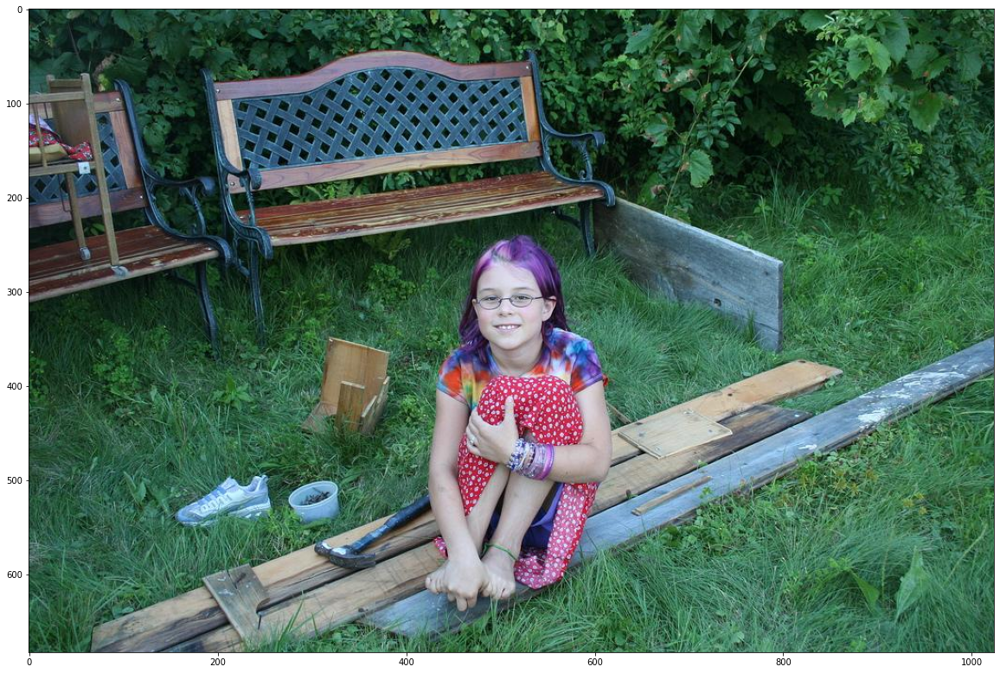

In [63]:
img_name = 'i1198772915'
if True:
    #locpath = '../ALLSTIMULI/' + img_names[10] + '.jpeg'
    #locpath = '../ALLSTIMULI/' + data['name'][0] + '.jpeg'
    locpath = '../ALLSTIMULI/' + img_name + '.jpeg'
    img_orig = Image.open(locpath) 
else:
    locpath= '../data/professional_test/test/namphuong-van-260.png'
    locpath= '../data/professional_test/test/shannon-kelley-108053.png'
    img_orig = Image.open(locpath).resize((1024,768)) 

plt.figure(figsize=(20,15))
if color_mode=='hsv':
    img_orig = rgb2hsv(img_orig)
    plt.imshow(hsv2rgb(img_orig))
elif color_mode=='lab':
    img_orig = rgb2lab(img_orig)
    plt.imshow(lab2rgb(img_orig))
else:
    plt.imshow(img_orig)

In [64]:
img_tens = torch.Tensor(np.array(img_orig)[None,...]).permute(0,3,1,2)


In [65]:
img_crop = cropped_pyramid(img_tens, 
                           width=width,
                           color=color, 
                           do_mask=do_mask, 
                           verbose=True, 
                           n_levels=n_levels)[0]

Tensor shape= torch.Size([1, 3, 341, 512]) , shape= torch.Size([1, 3, 683, 1024])
Tensor shape= torch.Size([1, 3, 170, 256]) , shape= torch.Size([1, 3, 341, 512])
Tensor shape= torch.Size([1, 3, 85, 128]) , shape= torch.Size([1, 3, 170, 256])
Tensor shape= torch.Size([1, 3, 42, 64]) , shape= torch.Size([1, 3, 85, 128])
Tensor shape= torch.Size([1, 3, 21, 32]) , shape= torch.Size([1, 3, 42, 64])
Tensor shape= torch.Size([1, 3, 10, 16]) , shape= torch.Size([1, 3, 21, 32])
Top tensor shape= torch.Size([1, 3, 10, 16]) , Final n_levels= 7


In [66]:
log_gabor_coeffs = log_gabor_transform(img_crop, K)
log_gabor_coeffs.shape

torch.Size([1, 7, 3, 2, 16, 8, 2])

In [67]:
full_img_rec.shape

torch.Size([4, 3, 768, 1024])

In [68]:
autoenc_inputs = log_gabor_coeffs[:,:n_levels-1,...].clone()

if color_mode == 'rgb':
    autoenc_inputs /= 256

log_gabor_coeffs_rec = autoenc( autoenc_inputs )   
log_gabor_coeffs_rec = log_gabor_coeffs_rec.view(1, (n_levels-1), -1) 
if color_mode == 'rgb':
    log_gabor_coeffs_rec *= 256

In [69]:
log_gabor_coeffs_rec_cat = torch.cat((log_gabor_coeffs_rec.view(1, n_levels-1, n_color, n_eccentricity, n_azimuth, n_theta, n_phase), 
                                      log_gabor_coeffs[0:,-1:,...]), 1)

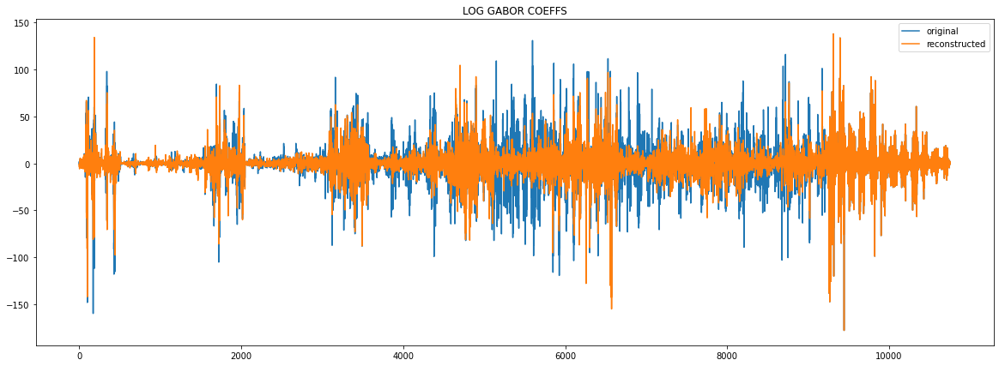

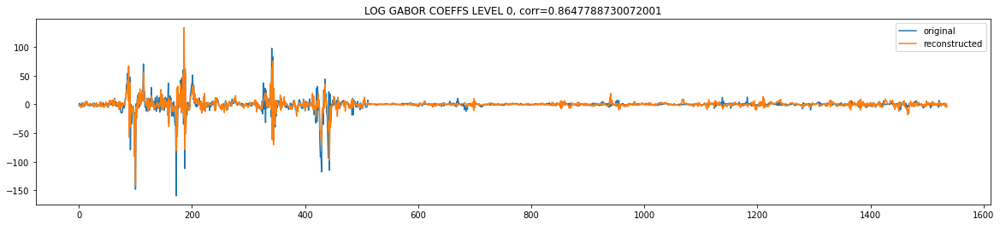

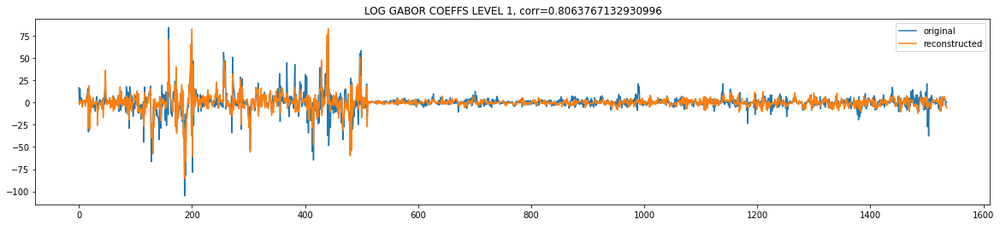

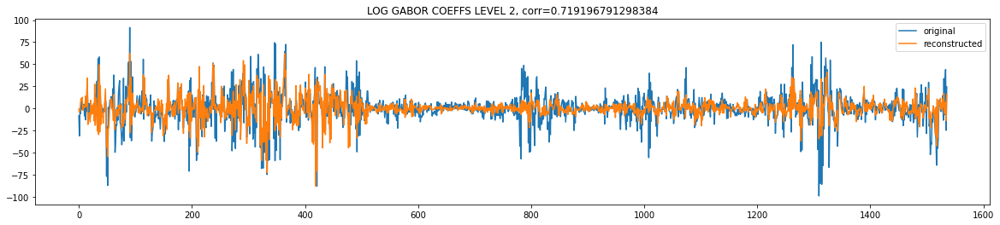

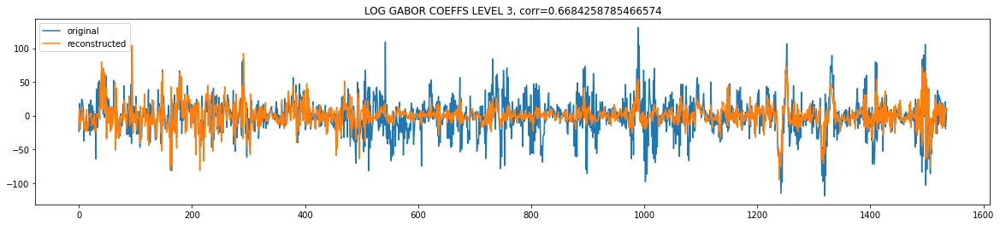

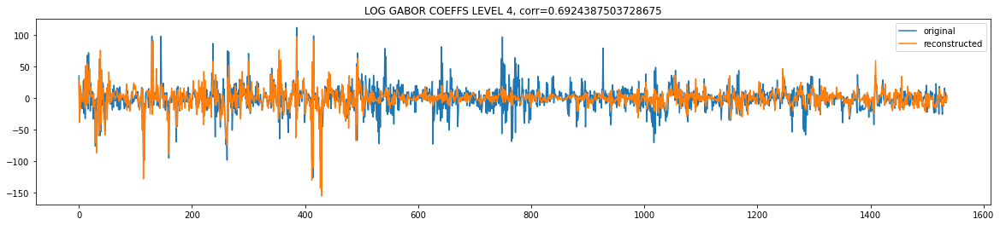

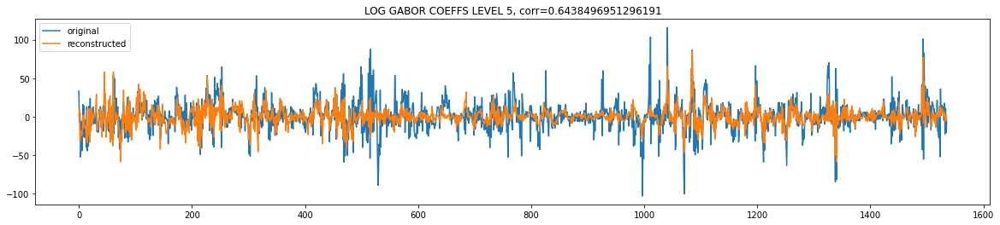

In [70]:
plt.figure(figsize=(20,7))
plt.plot(log_gabor_coeffs.numpy().flatten()[:], label = 'original')
plt.plot(log_gabor_coeffs_rec_cat.detach().numpy().flatten()[:], label = 'reconstructed')
plt.title('LOG GABOR COEFFS')
plt.legend()
for level in range(n_levels-1):
    plt.figure(figsize=(20,4))
    plt.plot(log_gabor_coeffs[0,level,...].numpy().flatten(), label = 'original')
    plt.plot(log_gabor_coeffs_rec[0,level,...].detach().numpy().flatten(), label = 'reconstructed')
    c = np.corrcoef([log_gabor_coeffs[0,level,...].numpy().flatten(), log_gabor_coeffs_rec[0,level,...].detach().numpy().flatten()])[0,1]
    plt.title('LOG GABOR COEFFS LEVEL '+str(level)+', corr='+str(c))
    plt.legend()


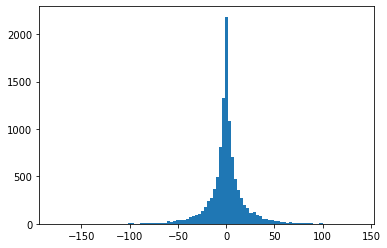

In [71]:
_=plt.hist(log_gabor_coeffs.numpy().flatten(),100)

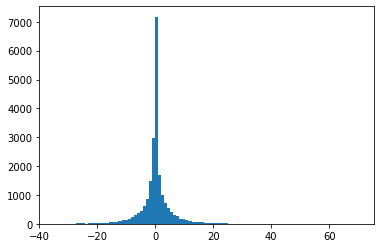

In [72]:
_=plt.hist(img_crop.numpy().flatten(),100)

## Reconstruction tests

Filter tensor shape= torch.Size([32, 32, 2, 16, 8, 2])
Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([512, 1024])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


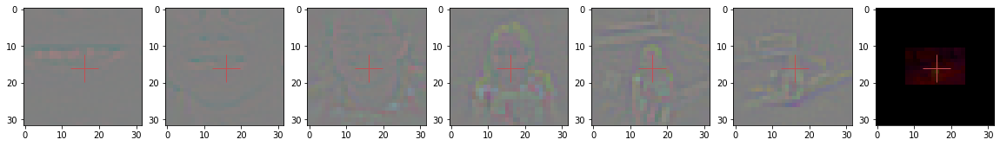

In [73]:
K_inv = get_K_inv(K, width=width, n_sublevel = n_sublevel, n_azimuth = n_azimuth, n_theta = n_theta, n_phase = n_phase)
img_rec=inverse_gabor(log_gabor_coeffs.detach(), K_inv)
img_rec[:,-1,...] = img_crop[:,-1,...]
axs = tensor_pyramid_display(img_rec.clone()) 

In [74]:
inv_LGmap_input = log_gabor_coeffs_rec.view((n_levels-1) * n_color, n_eccentricity * n_azimuth * n_theta * n_phase)
inv_LGmap_input.shape

torch.Size([18, 512])

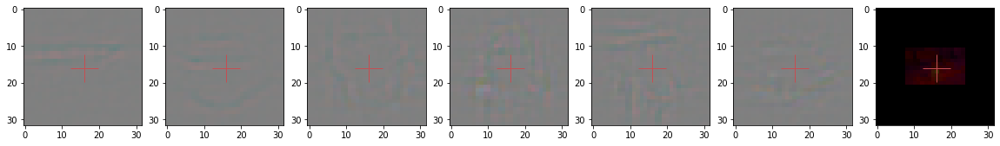

In [75]:
img_rec_rec = invLGmap(inv_LGmap_input) #inv_LGmap_input)
img_rec_rec = img_rec_rec.view(1, n_levels-1, n_color, width, width).detach()
img_rec_rec = torch.cat((img_rec_rec, img_crop[0:,-1:,...]), 1)
#img_rec_rec[0,-1,...] *=0 #+= 128
axs = tensor_pyramid_display(img_rec_rec)

### Test de invLGmap uniquement sur log gabor coeffs originaux

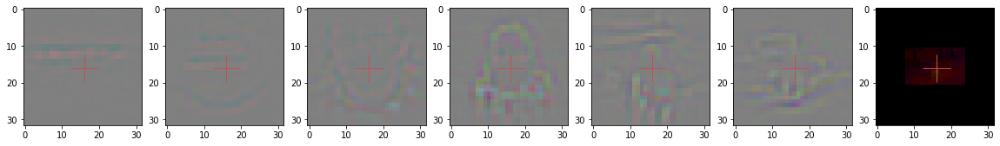

In [76]:
img_rec_test = invLGmap(log_gabor_coeffs.view(n_levels * n_color, n_eccentricity * n_azimuth * n_theta * n_phase)) #inv_LGmap_input)
img_rec_test = img_rec_test.view(1, n_levels, n_color, width, width).detach()
img_rec_test[:,-1,...] = img_crop[:,-1,...]
axs = tensor_pyramid_display(img_rec_test)

### Test des coeffs reconstruits avec differentes valeurs de K_inv 

Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Reshaped filter tensor= torch.Size([1024, 512])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])
Reshaped filter tensor= torch.Size([1024

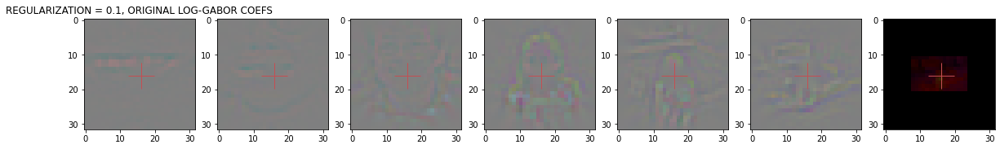

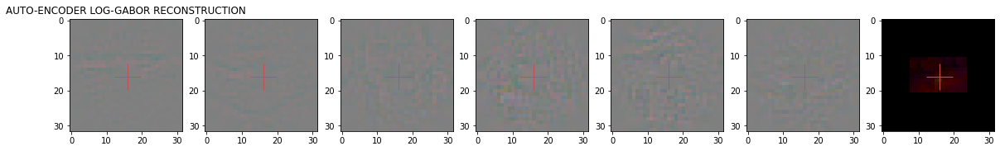

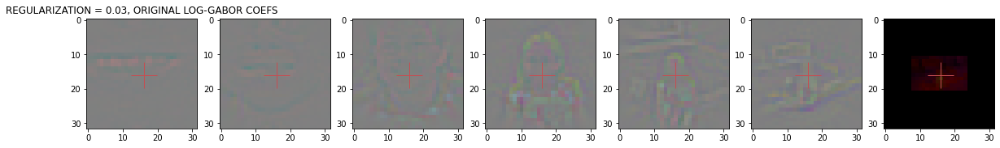

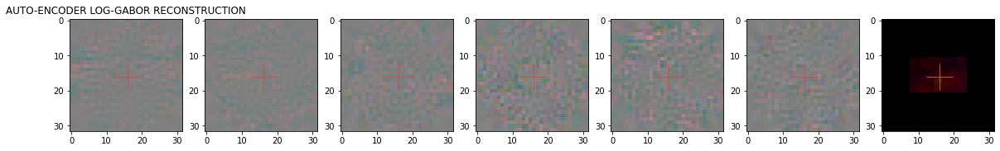

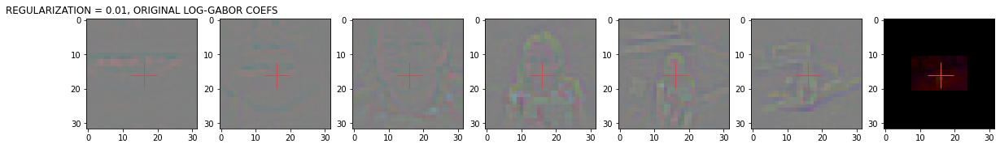

...

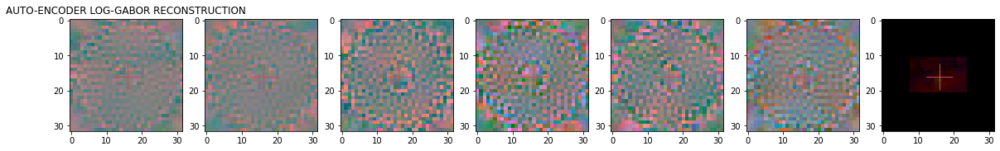

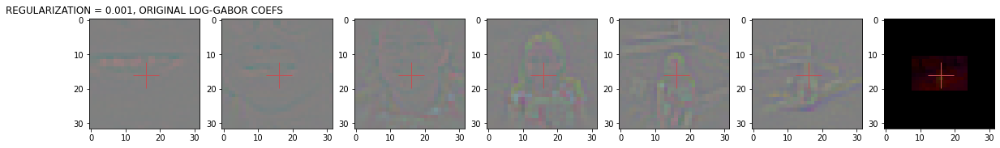

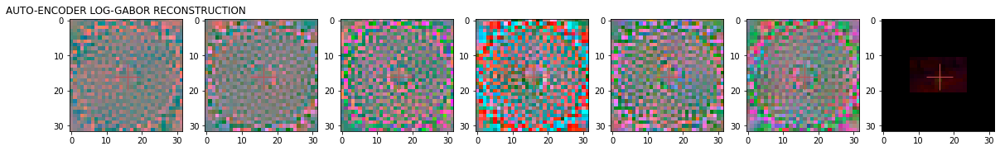

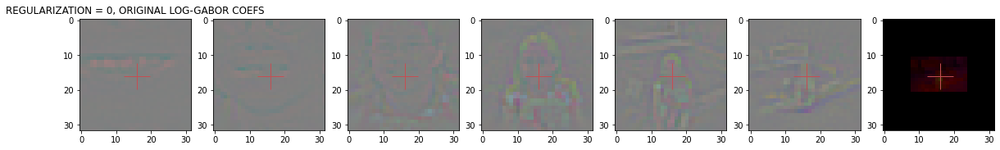

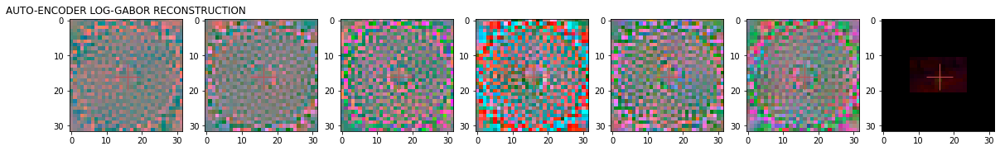

In [77]:
img_rec_rec_test = []
for i, rcond in enumerate((0.1, 0.03, 0.01, 0.003, 0.001, 0)):
    K_ = K.reshape((width**2, n_sublevel*n_azimuth*n_theta*n_phase))
    print('Reshaped filter tensor=', K_.shape)
    if rcond>0:
        K_inv_test = torch.pinverse(K_, rcond=rcond) 
    else:
        K_inv_test = torch.pinverse(K_)
    print('Tensor shape=', K_inv.shape)
    K_inv_test =K_inv_test.reshape(n_sublevel, n_azimuth, n_theta, n_phase, width, width)
    img_rcond_test = inverse_gabor(log_gabor_coeffs.detach(), K_inv_test)
    img_rcond_test[:,-1,...] = img_crop[:,-1,...]
    axs = tensor_pyramid_display(img_rcond_test)
    axs[0].set_title('REGULARIZATION = '+str(rcond)+', ORIGINAL LOG-GABOR COEFS')
    img_rec_rcond_test = inverse_gabor(log_gabor_coeffs_rec_cat.detach(), K_inv_test)
    img_rec_rcond_test[:,-1,...] = img_crop[:,-1,...]
    img_rec_rec_test.append(img_rec_rcond_test)
    axs = tensor_pyramid_display(img_rec_rcond_test)
    axs[0].set_title('AUTO-ENCODER LOG-GABOR RECONSTRUCTION')    

### Full image reconstruction

Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


"\nimg_rec_rec_test[3][:,-1,...]= img_crop[:,-1,...]\nfull_img_rec_rec_test = inverse_pyramid(img_rec_rec_test[3], color=color, gauss=gauss, n_levels=n_levels)\nfull_img_rec_rec_test = full_img_rec_rec_test.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')\n#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)\nplt.figure(figsize=(20,15))\nplt.imshow(full_img_rec_rec_test[0,:])\nplt.title('RECONSTRUCTED FROM AUTOENCODER OUTPUTS AND REGULARIZED INVERSE MAP')\n"

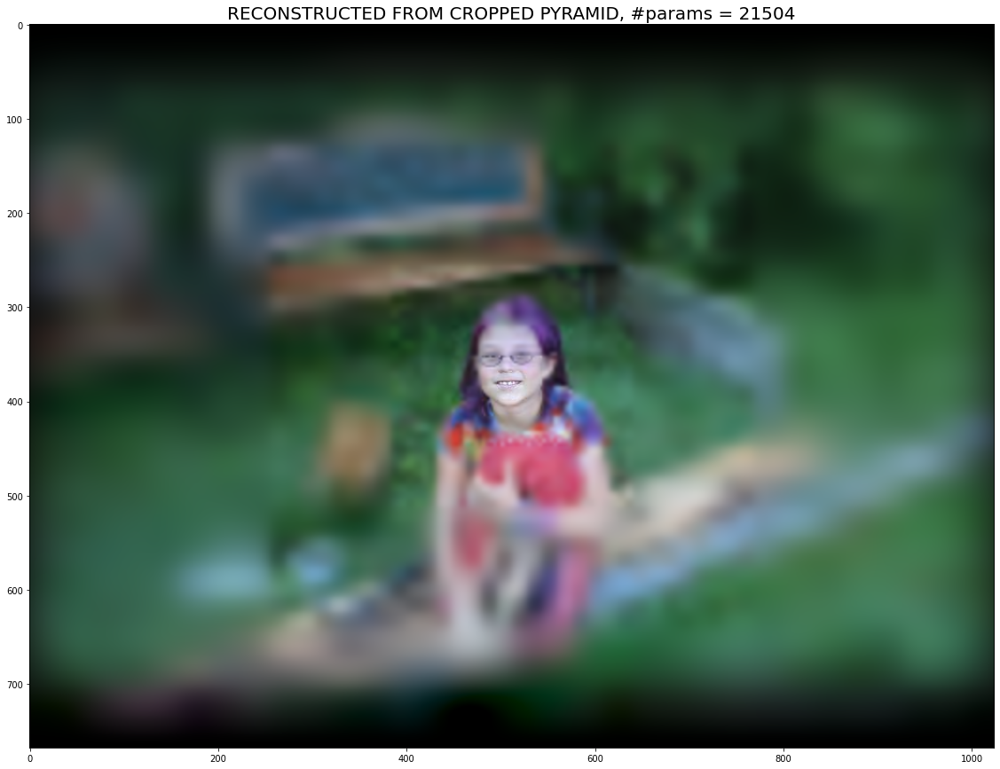

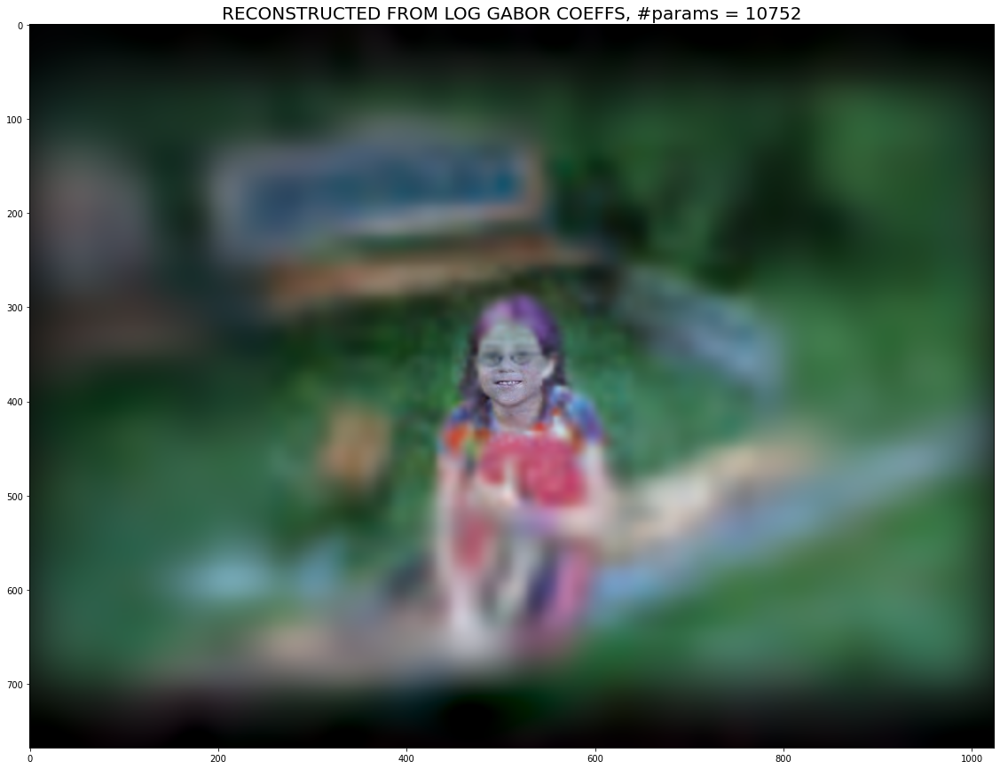

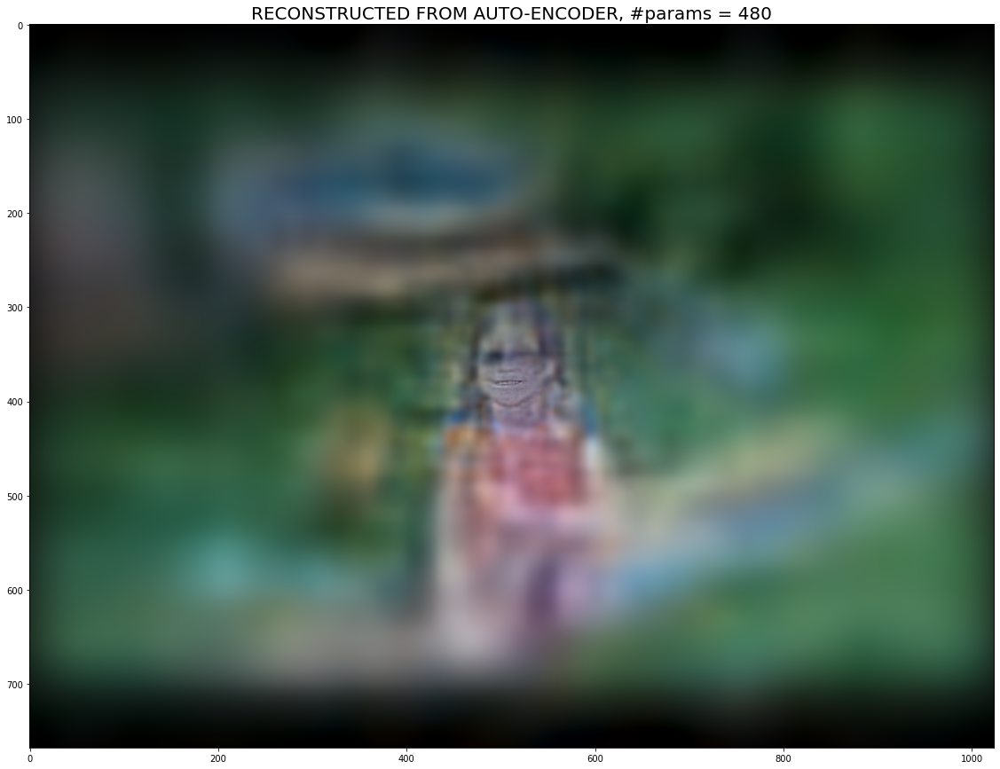

In [78]:
#img_crop = cropped_pyramid(img_tens, color=color, do_mask=do_mask, verbose=True, n_levels=n_levels)[0]
N_X, N_Y = full_img_rec.shape[1:3]


full_img_crop = inverse_pyramid(img_crop, color=color, gauss=gauss, n_levels=n_levels)
full_img_crop = full_img_crop.detach().permute(0,2,3,1).numpy()
    
plt.figure(figsize=(20,15))
image_show(full_img_crop[0,:], color_mode)
plt.title('RECONSTRUCTED FROM CROPPED PYRAMID, #params = ' + str(np.prod(img_crop[0,...].size())), fontsize=20)


img_rec=inverse_gabor(log_gabor_coeffs.detach(), K_inv)
img_rec[:,-1,...]= img_crop[:,-1,...]
full_img_rec = inverse_pyramid(img_rec, color=color, gauss=gauss, n_levels=n_levels)
full_img_rec = full_img_rec.detach().permute(0,2,3,1).numpy()
plt.figure(figsize=(20,15))
image_show(full_img_rec[0,:], color_mode)
plt.title('RECONSTRUCTED FROM LOG GABOR COEFFS, #params = ' + str(np.prod(log_gabor_coeffs[0,...].size())), fontsize=20)

full_img_rec_rec = inverse_pyramid(img_rec_rec, color=color, gauss=gauss, n_levels=n_levels)
full_img_rec_rec = full_img_rec_rec.detach().permute(0,2,3,1).numpy()
#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)
plt.figure(figsize=(20,15))
image_show(full_img_rec_rec[0,:], color_mode)
plt.title('RECONSTRUCTED FROM AUTO-ENCODER, #params = ' + str(np.prod(code[0,...].size())), fontsize=20)

'''
img_rec_rec_test[3][:,-1,...]= img_crop[:,-1,...]
full_img_rec_rec_test = inverse_pyramid(img_rec_rec_test[3], color=color, gauss=gauss, n_levels=n_levels)
full_img_rec_rec_test = full_img_rec_rec_test.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)
plt.figure(figsize=(20,15))
plt.imshow(full_img_rec_rec_test[0,:])
plt.title('RECONSTRUCTED FROM AUTOENCODER OUTPUTS AND REGULARIZED INVERSE MAP')
'''

Tensor shape= torch.Size([2, 16, 8, 2, 32, 32])


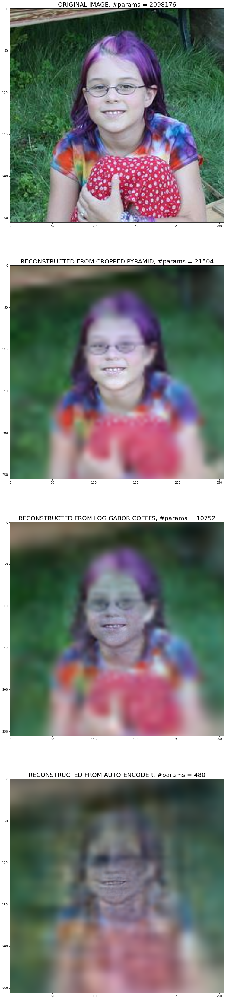

In [79]:
#img_crop = cropped_pyramid(img_tens, color=color, do_mask=do_mask, verbose=True, n_levels=n_levels)[0]
plt.figure(figsize=(20,60))

plt.subplot(4,1,1)
img = img_tens.detach().permute(0,2,3,1).numpy()
N_X, N_Y = img.shape[1:3]
image_show(img[0,N_X//2-128:N_X//2+128,
               N_Y//2-128:N_Y//2+128,:], color_mode)
plt.title('ORIGINAL IMAGE, #params = ' + str(np.prod(img_tens[0,...].size())), fontsize=20)

plt.subplot(4,1,2)
full_img_crop = inverse_pyramid(img_crop, color=color, gauss=gauss, n_levels=n_levels)
full_img_crop = full_img_crop.detach().permute(0,2,3,1).numpy()
N_X, N_Y = full_img_crop.shape[1:3]
image_show(full_img_crop[0,N_X//2-128:N_X//2+128,
                         N_Y//2-128:N_Y//2+128,:], color_mode)
plt.title('RECONSTRUCTED FROM CROPPED PYRAMID, #params = ' + str(np.prod(img_crop[0,...].size())), fontsize=20)

plt.subplot(4,1,3)
img_rec=inverse_gabor(log_gabor_coeffs.detach(), K_inv)
img_rec[:,-1,...]= img_crop[:,-1,...]
full_img_rec = inverse_pyramid(img_rec, color=color, gauss=gauss, n_levels=n_levels)
full_img_rec = full_img_rec.detach().permute(0,2,3,1).numpy()
image_show(full_img_rec[0,N_X//2-128:N_X//2+128,
                        N_Y//2-128:N_Y//2+128,:], color_mode)
plt.title('RECONSTRUCTED FROM LOG GABOR COEFFS, #params = ' + str(np.prod(log_gabor_coeffs[0,...].size())), fontsize=20)

plt.subplot(4,1,4)
full_img_rec_rec = inverse_pyramid(img_rec_rec, color=color, gauss=gauss, n_levels=n_levels)
full_img_rec_rec = full_img_rec_rec.detach().permute(0,2,3,1).numpy()
#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)
image_show(full_img_rec_rec[0,N_X//2-128:N_X//2+128,
                            N_Y//2-128:N_Y//2+128,:], color_mode)
plt.title('RECONSTRUCTED FROM AUTO-ENCODER, #params = ' + str(np.prod(code[0,...].size())), fontsize=20)

'''
img_rec_rec_test[3][:,-1,...]= img_crop[:,-1,...]
full_img_rec_rec_test = inverse_pyramid(img_rec_rec_test[3], color=color, gauss=gauss, n_levels=n_levels)
full_img_rec_rec_test = full_img_rec_rec_test.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)
plt.figure(figsize=(20,15))
plt.imshow(full_img_rec_rec_test[0,:])
plt.title('RECONSTRUCTED FROM AUTOENCODER OUTPUTS AND REGULARIZED INVERSE MAP')
'''
if False:
    plt.savefig(script_name+'.png', bbox_inches='tight')


In [80]:
img.shape

(1, 683, 1024, 3)

Text(0.5, 1.0, 'ROTATION/ZOOM FROM COMPRESSED SENSING LAYER')

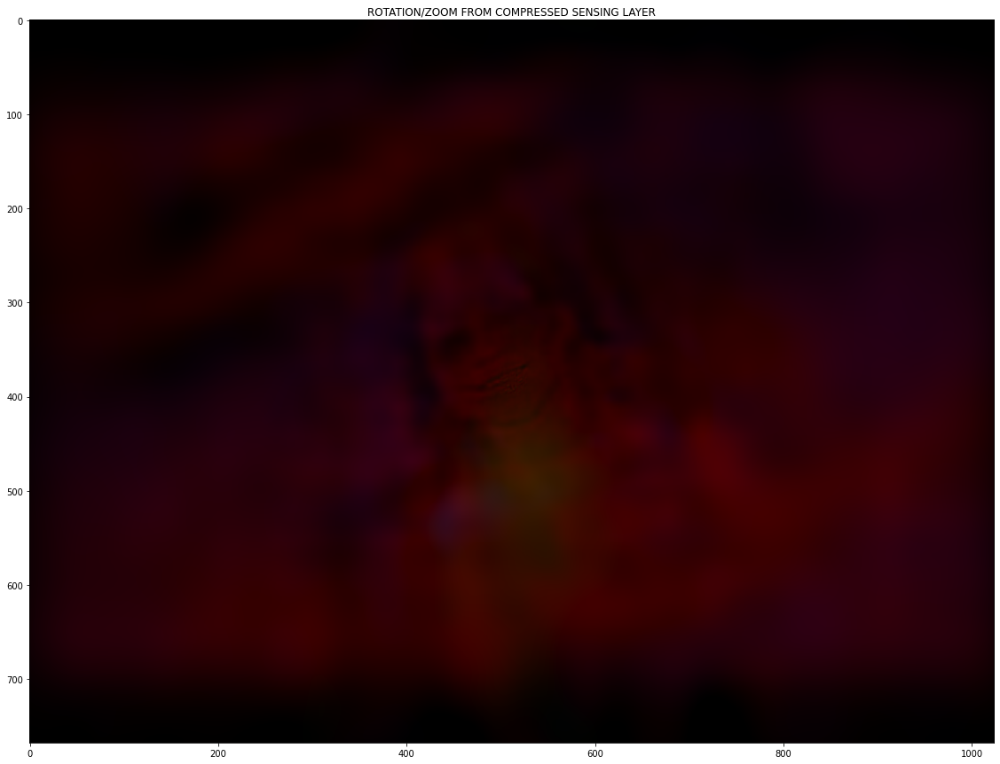

In [81]:
log_gabor_coeffs_roll = log_gabor_coeffs_rec.clone()
log_gabor_coeffs_roll = log_gabor_coeffs_roll.view(1,n_levels-1, n_color, n_eccentricity, n_azimuth, n_theta, n_phase)
#log_gabor_coeffs_roll[:,:n_levels-1,...]= log_gabor_coeffs_roll[:,:n_levels-1,...].roll(-4,4) #.roll(4, 4)
log_gabor_coeffs_roll= log_gabor_coeffs_roll.roll(1,4) #.roll(4, 4)
log_gabor_coeffs_roll= log_gabor_coeffs_roll.roll(1,1) #.roll(4, 4)

#log_gabor_coeffs_roll= log_gabor_coeffs_roll.roll(-1,5) #.roll(4, 4)
inv_LGmap_input = log_gabor_coeffs_roll.view((n_levels-1) * n_color, n_eccentricity * n_azimuth * n_theta * n_phase)
img_rec_rec_roll = invLGmap(inv_LGmap_input) #inv_LGmap_input)
img_rec_rec_roll = img_rec_rec_roll.view(1, n_levels-1, n_color, width, width).detach()
img_rec_rec_roll = torch.cat((img_rec_rec_roll, img_crop[0:,-1:,...]), 1)

full_img_rec_rec_roll = inverse_pyramid(img_rec_rec_roll, color=color, gauss=gauss, n_levels=n_levels)
full_img_rec_rec_roll = full_img_rec_rec_roll.detach().permute(0,2,3,1).numpy().clip(0,255).astype('uint8')
#ax = tensor_image_cmp(full_img_rec, full_img_rec_rec)
plt.figure(figsize=(20,15))
plt.imshow(full_img_rec_rec_roll[0,:])
plt.title('ROTATION/ZOOM FROM COMPRESSED SENSING LAYER')
#log_gabor_coeffs_roll[:,:n_levels-1,...] = log_gabor_coeffs_roll[:,:n_levels-1,...].roll(1,1) #.roll(4, 4)

In [82]:
log_gabor_coeffs_roll.shape

torch.Size([1, 6, 3, 2, 16, 8, 2])

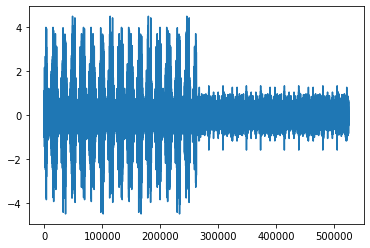

In [83]:
plt.plot(K_inv.flatten())

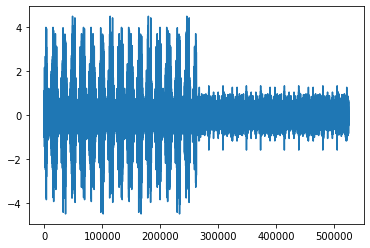

In [84]:
plt.plot(K_inv_test.flatten())

In [85]:
6*2*16

192

In [86]:
512*7*7*7*7

1229312

In [87]:
T = torch.FloatTensor(((1,2),(3,4)))

In [88]:
T[0,:]

tensor([1., 2.], dtype=torch.float32)

In [89]:
T.view(4)

tensor([1., 2., 3., 4.], dtype=torch.float32)

In [90]:
print("#params :" + str(np.prod(code[0,...].size())))

#params :480


In [91]:
code[0,...].shape

torch.Size([20, 3, 4, 2])

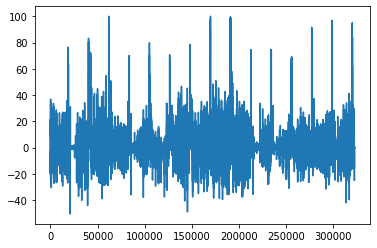

In [92]:
plt.plot(data['img_crop'].flatten())